In [68]:
#Data combined, cleaned, and explored, handle class imbalance
#Final sheet, lets make it look cleaner by ingoring the warnings
import warnings
warnings.filterwarnings('ignore')
#Load the libraries to list tsv files and combined them to a dataframe
from pathlib import Path
import numpy as np
import pandas as pd
from IPython.display import IFrame
from IPython.display import display
import os , re, codecs

import nltk
from nltk.corpus import stopwords
#nltk.download('stopwords')
from nltk.tokenize import word_tokeniz

In [28]:
#Multiple labelled dataasets
#Combine datasets into one single dataset
#Add also the information related to dataset as an additional column
#Data avaliable from https://crisisnlp.qcri.org/data/lrec2016/labeled_cf/CrisisNLP_labeled_data_crowdflower_v2.zip
files = Path('CrisisNLP_labeled_data_crowdflower').glob('**/*.tsv')
dfs = [pd.read_csv(f, sep="\t").assign(DataSet=os.path.basename(f).split('.')[0]) for f in files]
data = pd.concat(dfs,ignore_index=True)

In [29]:
#Randomize the dataset before displaying it 
#randomize the data
np.random.seed(42)
data = data.sample(frac=1)
data = data.reset_index(drop=True)

In [30]:
#Display data 
display(data)

,tweet_id,tweet_text,label,DataSet
0,'593188404340379648',RT @JigarShahDC: #Solar lamps only public ligh...,infrastructure_and_utilities_damage,2015_Nepal_Earthquake_en_CF_labeled_data
1,'451566588911554561',"Another earthquake registered in Chile, magnit...",other_useful_information,2014_Chile_Earthquake_en_CF_labeled_data
2,'505126117733568512',RT @WWECreative_ish: If Big Show &amp; @TheMar...,other_useful_information,2014_California_Earthquake_CF_labeled_data
3,'514260670565466113',Alaska Airlines halts flights from LA to Cabo ...,infrastructure_and_utilities_damage,2014_Hurricane_Odile_Mexico_en_CF_labeled_data
4,'503755189107822592',News Update: Northern California Experiences M...,other_useful_information,2014_California_Earthquake_CF_labeled_data
...,...,...,...,...
18962,'509351780958756865',"RT @Qudsipk: #BiggestLiesEverTold PM lies , we...",other_useful_information,2014_Pakistan_floods_CF_labeled_data
18963,'541697581865107456',RT @govph: Comprehensive situation report on #...,other_useful_information,2014_Philippines_Typhoon_Hagupit_en_CF_labeled...
18964,'451304479615229952',#NappetTours #PrayForChile youth missions thro...,not_related_or_irrelevant,2014_Chile_Earthquake_en_CF_labeled_data
18965,'383166710989090816',#Earthquake of M 5.4 - Reykjanes Ridge http://...,other_useful_information,2013_Pakistan_eq_CF_labeled_data


In [34]:
data

,tweet_id,tweet_text,label,DataSet
0,'593188404340379648',RT @JigarShahDC: #Solar lamps only public ligh...,infrastructure_and_utilities_damage,2015_Nepal_Earthquake_en_CF_labeled_data
1,'451566588911554561',"Another earthquake registered in Chile, magnit...",other_useful_information,2014_Chile_Earthquake_en_CF_labeled_data
2,'505126117733568512',RT @WWECreative_ish: If Big Show &amp; @TheMar...,other_useful_information,2014_California_Earthquake_CF_labeled_data
3,'514260670565466113',Alaska Airlines halts flights from LA to Cabo ...,infrastructure_and_utilities_damage,2014_Hurricane_Odile_Mexico_en_CF_labeled_data
4,'503755189107822592',News Update: Northern California Experiences M...,other_useful_information,2014_California_Earthquake_CF_labeled_data
...,...,...,...,...
18962,'509351780958756865',"RT @Qudsipk: #BiggestLiesEverTold PM lies , we...",other_useful_information,2014_Pakistan_floods_CF_labeled_data
18963,'541697581865107456',RT @govph: Comprehensive situation report on #...,other_useful_information,2014_Philippines_Typhoon_Hagupit_en_CF_labeled...
18964,'451304479615229952',#NappetTours #PrayForChile youth missions thro...,not_related_or_irrelevant,2014_Chile_Earthquake_en_CF_labeled_data
18965,'383166710989090816',#Earthquake of M 5.4 - Reykjanes Ridge http://...,other_useful_information,2013_Pakistan_eq_CF_labeled_data


,DataSet,% of Count
2015_Nepal_Earthquake_en_CF_labeled_data,3003,15.832762
2014_Philippines_Typhoon_Hagupit_en_CF_labeled_data,2010,10.597353
2015_Cyclone_Pam_en_CF_labeled_data,2004,10.565719
2014_Chile_Earthquake_en_CF_labeled_data,1932,10.186113
2013_Pakistan_eq_CF_labeled_data,1881,9.917225
2014_India_floods_CF_labeled_data,1820,9.595613
2014_Pakistan_floods_CF_labeled_data,1769,9.326725
2014_California_Earthquake_CF_labeled_data,1701,8.968208
2014_Chile_Earthquake_cl_labeled_data,1585,8.356619
2014_Hurricane_Odile_Mexico_en_CF_labeled_data,1262,6.653662


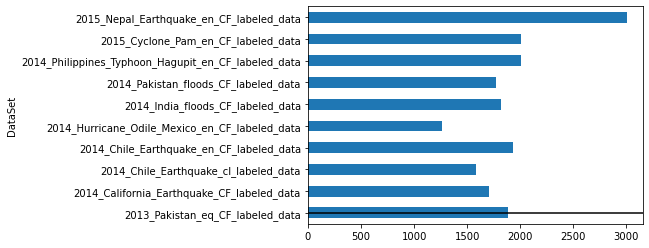

In [37]:
#Visualize the data summary according to the crisis 
# define a function inspect the distribution of the data

%matplotlib inline
import matplotlib.pyplot as plt

def count_table(df, c, k):
        count = df[c].value_counts()
        count_percent = 100 * count / len(df)
        
        count_table = pd.concat([count, count_percent], axis=1)
        
        count_table.columns = [c, '% of Count']
        count_table.round(2)

        gb = df.groupby(df[c])
        targetEDA=gb[c].aggregate(len)
        
        plt.figure()
        targetEDA.plot(kind=k, grid=False)
        plt.axhline(0, color='k')
        
        return count_table
count_table(data,'DataSet','barh')

In [64]:
#Check for any null values
print (data.isnull().values.any())
print (data.isnull().sum())

False
tweet_id      0
tweet_text    0
label         0
DataSet       0
dtype: int64


In [65]:
#Drop columns of no further value as only text and label column is needed for classification 
data = data.drop(['tweet_id','DataSet'], axis = 1)

In [66]:
# Write the combined dataset without preprocessing into a csv file
data.to_csv('CrisisNLP_C.csv', index=False)

In [69]:
# Data ready for text cleanup and preprocessing 

# define a function to clean the text column 

def clean_text(lst):
    clean_tweet = []
    for tweet in lst:
        print ("[original]", tweet)

        # 1. normalizing utf8 formatting 
        tweet = tweet.encode("utf8").decode("utf8")
#         tweet = tweet.encode("ascii","ignore")
        tweet = tweet.strip(' \t\n\r')
    
        # 2. lowering case 
        tweet = re.sub(' +', ' ', tweet)
        tweet = tweet.lower()
        print ("[lowercase]", tweet)

        # 3. normalizing digits
        tweet_words = tweet.strip('\r').split(' ')
        for word in [word for word in tweet_words if word.isdigit()]:
            tweet = tweet.replace(word, "D" * len(word))
        print ("[digits]", tweet)
        
        # 4. normalizing urls
        tweet_words = tweet.strip('\r').split(' ')
        for word in [word for word in tweet_words if '/' in word or '.' in word and len(word) > 3]:
            tweet = tweet.replace(word, "urls")
        print ("[urls]", tweet)
        
        #5. username 
        tweet_words = tweet.strip('\r').split(' ')
        for word in [word for word in tweet_words if word[0] == '@' and len(word) > 1]:
            tweet = tweet.replace(word, "usrId")
        print ("[username]", tweet)
        
        # 6. special characters
        punc = '#@$%^&*()_+-={}[]】【:"|\'\~`<>/,'
        trans = str.maketrans(punc, ' '*len(punc))
        tweet = tweet.translate(trans)
        print ("[punctuation]", tweet)
        
        # 7. Normalizing +2 elongated char
        tweet = re.sub(r"(.)\1\1+",r'\1\1', tweet)
        print ("[elong]", tweet)
        
        # 8. fix \n char
        tweet = tweet.replace('\n', ' ')

        clean_tweet.append(tweet.strip())

    return clean_tweet

In [70]:
#Sanitize the tweet text data
clean = clean_text(data['tweet_text'])

[original] RT @JigarShahDC: #Solar lamps only public light in #Nepal; electric poles down; solar now has a crucial role during disasters. http://t.co/…
[lowercase] rt @jigarshahdc: #solar lamps only public light in #nepal; electric poles down; solar now has a crucial role during disasters. http://t.co/…
[digits] rt @jigarshahdc: #solar lamps only public light in #nepal; electric poles down; solar now has a crucial role during disasters. http://t.co/…
[urls] rt @jigarshahdc: #solar lamps only public light in #nepal; electric poles down; solar now has a crucial role during urls urls
[username] rt usrId #solar lamps only public light in #nepal; electric poles down; solar now has a crucial role during urls urls
[punctuation] rt usrId  solar lamps only public light in  nepal; electric poles down; solar now has a crucial role during urls urls
[elong] rt usrId  solar lamps only public light in  nepal; electric poles down; solar now has a crucial role during urls urls
[original] Another earthq

[lowercase] #encroachment #drain #rain #riverbed #mismanagement #punjab #lahore #flood no plan to remove encroachments http://t.co/goxwyoemgn
[digits] #encroachment #drain #rain #riverbed #mismanagement #punjab #lahore #flood no plan to remove encroachments http://t.co/goxwyoemgn
[urls] #encroachment #drain #rain #riverbed #mismanagement #punjab #lahore #flood no plan to remove encroachments urls
[username] #encroachment #drain #rain #riverbed #mismanagement #punjab #lahore #flood no plan to remove encroachments urls
[punctuation]  encroachment  drain  rain  riverbed  mismanagement  punjab  lahore  flood no plan to remove encroachments urls
[elong]  encroachment  drain  rain  riverbed  mismanagement  punjab  lahore  flood no plan to remove encroachments urls
[original] RT @MurtazaGeoNews: Army to make all efforts to help flood victims, says COAS Visits deluged areas of Punjab http://t.co/A4kD5gVU0R
[lowercase] rt @murtazageonews: army to make all efforts to help flood victims, says coa

[punctuation] rt usrId  iquique  delincuentes vestidos de bomberos  marcan  las casas  en un falso catastro por algunos urls cuidado!! htt…
[elong] rt usrId  iquique  delincuentes vestidos de bomberos  marcan  las casas  en un falso catastro por algunos urls cuidado!! htt…
[original] 180 dead as floods wash away homes in Nepal, India: Doctors inspect x-rays of landslide victims a... http://t.co/VNnGB1ar8g #IndiaHealth
[lowercase] 180 dead as floods wash away homes in nepal, india: doctors inspect x-rays of landslide victims a... http://t.co/vnngb1ar8g #indiahealth
[digits] DDD dead as floods wash away homes in nepal, india: doctors inspect x-rays of landslide victims a... http://t.co/vnngb1ar8g #indiahealth
[urls] DDD dead as floods wash away homes in nepal, india: doctors inspect x-rays of landslide victims urls urls #indiahealth
[username] DDD dead as floods wash away homes in nepal, india: doctors inspect x-rays of landslide victims urls urls #indiahealth
[punctuation] DDD dead as f

[digits] #india is not responsible for #flood in #pakistan - so stop shouting and blaming them. where the fuk disaster management is ? what they did
[urls] #india is not responsible for #flood in #pakistan - so stop shouting and blaming urls where the fuk disaster management is ? what they did
[username] #india is not responsible for #flood in #pakistan - so stop shouting and blaming urls where the fuk disaster management is ? what they did
[punctuation]  india is not responsible for  flood in  pakistan   so stop shouting and blaming urls where the fuk disaster management is ? what they did
[elong]  india is not responsible for  flood in  pakistan  so stop shouting and blaming urls where the fuk disaster management is ? what they did
[original] T-Mobile makes calling &amp; texting Nepal free, waives bills to aid earthquake relief efforts http://t.co/l3rPJkaLrj
[lowercase] t-mobile makes calling &amp; texting nepal free, waives bills to aid earthquake relief efforts http://t.co/l3rpjkal

[original] Ghost of flood haunts people in Kashmir: http://t.co/lnWSGcqm9C via @dailyexcelsior_
[lowercase] ghost of flood haunts people in kashmir: http://t.co/lnwsgcqm9c via @dailyexcelsior_
[digits] ghost of flood haunts people in kashmir: http://t.co/lnwsgcqm9c via @dailyexcelsior_
[urls] ghost of flood haunts people in kashmir: urls via @dailyexcelsior_
[username] ghost of flood haunts people in kashmir: urls via usrId
[punctuation] ghost of flood haunts people in kashmir  urls via usrId
[elong] ghost of flood haunts people in kashmir  urls via usrId
[original] Death toll uncertain as biggest quake in more than 80 years hits Nepal. http://t.co/FRu1ss7g4i
[lowercase] death toll uncertain as biggest quake in more than 80 years hits nepal. http://t.co/fru1ss7g4i
[digits] death toll uncertain as biggest quake in more than DD years hits nepal. http://t.co/fru1ss7g4i
[urls] death toll uncertain as biggest quake in more than DD years hits urls urls
[username] death toll uncertain as bigg

[punctuation] come out and let s show pam some love and wish her a happy birthday! outside oyster roast at noon  urls urls
[elong] come out and let s show pam some love and wish her a happy birthday! outside oyster roast at noon  urls urls
[original] #FuerzaChile jaja y piden ayuda jaja que los ayuden los ingleses manga de traidores
[lowercase] #fuerzachile jaja y piden ayuda jaja que los ayuden los ingleses manga de traidores
[digits] #fuerzachile jaja y piden ayuda jaja que los ayuden los ingleses manga de traidores
[urls] #fuerzachile jaja y piden ayuda jaja que los ayuden los ingleses manga de traidores
[username] #fuerzachile jaja y piden ayuda jaja que los ayuden los ingleses manga de traidores
[punctuation]  fuerzachile jaja y piden ayuda jaja que los ayuden los ingleses manga de traidores
[elong]  fuerzachile jaja y piden ayuda jaja que los ayuden los ingleses manga de traidores
[original] RT @chxlsev: the most fucked up thing is giving someone everything, then finding out they

[username] un sismo de 8,2 sacudió la noche del martes el norte de urls murieron D urls evacuación y alerta de tsunami urls
[punctuation] un sismo de 8 2 sacudió la noche del martes el norte de urls murieron D urls evacuación y alerta de tsunami urls
[elong] un sismo de 8 2 sacudió la noche del martes el norte de urls murieron D urls evacuación y alerta de tsunami urls
[original] Deadly cyclone strikes Pacific island nation and UMBC suspends LAX players. Details on #WJZ @cbsbaltimore
[lowercase] deadly cyclone strikes pacific island nation and umbc suspends lax players. details on #wjz @cbsbaltimore
[digits] deadly cyclone strikes pacific island nation and umbc suspends lax players. details on #wjz @cbsbaltimore
[urls] deadly cyclone strikes pacific island nation and umbc suspends lax urls details on #wjz @cbsbaltimore
[username] deadly cyclone strikes pacific island nation and umbc suspends lax urls details on #wjz usrId
[punctuation] deadly cyclone strikes pacific island nation and u

[username] nepal’s disaster should be warning on development urls #topnews
[punctuation] nepal’s disaster should be warning on development urls  topnews
[elong] nepal’s disaster should be warning on development urls  topnews
[original] Chile have a 8.2 magnitude earthquake. My prayers to the family at there !
[lowercase] chile have a 8.2 magnitude earthquake. my prayers to the family at there !
[digits] chile have a 8.2 magnitude earthquake. my prayers to the family at there !
[urls] chile have a 8.2 magnitude urls my prayers to the family at there !
[username] chile have a 8.2 magnitude urls my prayers to the family at there !
[punctuation] chile have a 8.2 magnitude urls my prayers to the family at there !
[elong] chile have a 8.2 magnitude urls my prayers to the family at there !
[original] Por fin ayuda a los pescadores!!! *-* arriba norte de chile #FuerzaChile #FuerzaNorteDeChile
[lowercase] por fin ayuda a los pescadores!!! *-* arriba norte de chile #fuerzachile #fuerzanortedechi

[urls] rt @narendramodi: my gratitude to pm @netanyahu for his kind words on india's relief &amp; rescue efforts in nepal including help extended to i…
[username] rt usrId my gratitude to pm usrId for his kind words on india's relief &amp; rescue efforts in nepal including help extended to i…
[punctuation] rt usrId my gratitude to pm usrId for his kind words on india s relief  amp; rescue efforts in nepal including help extended to i…
[elong] rt usrId my gratitude to pm usrId for his kind words on india s relief  amp; rescue efforts in nepal including help extended to i…
[original] RT @PaulaMendoza: Ayudemos a #Iquique cn artículos de higiene y cuidado personal. Aportes en Manuel de Salas 114, Pza #Ñuñoa F 22533555 htt…
[lowercase] rt @paulamendoza: ayudemos a #iquique cn artículos de higiene y cuidado personal. aportes en manuel de salas 114, pza #ñuñoa f 22533555 htt…
[digits] rt @paulamendoza: ayudemos a #iquique cn artículos de higiene y cuidado personal. aportes en manuel de salas

[original] Did you know Seismographs near Charlotte were able to detect vibrations from #NepalEarthquake? More at 10:14. http://t.co/loDCEp4my2
[lowercase] did you know seismographs near charlotte were able to detect vibrations from #nepalearthquake? more at 10:14. http://t.co/lodcep4my2
[digits] did you know seismographs near charlotte were able to detect vibrations from #nepalearthquake? more at 10:14. http://t.co/lodcep4my2
[urls] did you know seismographs near charlotte were able to detect vibrations from #nepalearthquake? more at urls urls
[username] did you know seismographs near charlotte were able to detect vibrations from #nepalearthquake? more at urls urls
[punctuation] did you know seismographs near charlotte were able to detect vibrations from  nepalearthquake? more at urls urls
[elong] did you know seismographs near charlotte were able to detect vibrations from  nepalearthquake? more at urls urls
[original] RT @_B_Ryan: Expect 8.2 Chile earthquake to set off tremors around

[lowercase] sσy_ρσяиσgяαfιςσ: monsoon: dozens of people have been killed in flooding in northern and eastern india, while the death tol... « fin »
[digits] sσy_ρσяиσgяαfιςσ: monsoon: dozens of people have been killed in flooding in northern and eastern india, while the death tol... « fin »
[urls] sσy_ρσяиσgяαfιςσ: monsoon: dozens of people have been killed in flooding in northern and eastern india, while the death urls « fin »
[username] sσy_ρσяиσgяαfιςσ: monsoon: dozens of people have been killed in flooding in northern and eastern india, while the death urls « fin »
[punctuation] sσy ρσяиσgяαfιςσ  monsoon  dozens of people have been killed in flooding in northern and eastern india  while the death urls « fin »
[elong] sσy ρσяиσgяαfιςσ  monsoon  dozens of people have been killed in flooding in northern and eastern india  while the death urls « fin »
[original] World Bank Extends Support to Nepal: Extending support to earthquake-hit Nepal, World Bank President Jim Yong Kim has said the

[username] rt usrId the helpless indian prime minster only matches the powerless pakistani president in terms of balance of protocol #india…
[punctuation] rt usrId the helpless indian prime minster only matches the powerless pakistani president in terms of balance of protocol  india…
[elong] rt usrId the helpless indian prime minster only matches the powerless pakistani president in terms of balance of protocol  india…
[original] RT @inquirerdotnet: ICYMI: Here are the emergency contact information to remember ahead of #RubyPH: http://t.co/sHw54bxZ1r
[lowercase] rt @inquirerdotnet: icymi: here are the emergency contact information to remember ahead of #rubyph: http://t.co/shw54bxz1r
[digits] rt @inquirerdotnet: icymi: here are the emergency contact information to remember ahead of #rubyph: http://t.co/shw54bxz1r
[urls] rt @inquirerdotnet: icymi: here are the emergency contact information to remember ahead of #rubyph: urls
[username] rt usrId icymi: here are the emergency contact inform

[urls] rt @senator_baloch: #balochistan death, destruction and guns #earthquake #awaran urls
[username] rt usrId #balochistan death, destruction and guns #earthquake #awaran urls
[punctuation] rt usrId  balochistan death  destruction and guns  earthquake  awaran urls
[elong] rt usrId  balochistan death  destruction and guns  earthquake  awaran urls
[original] Nepal earthquake: Kathmandu turns into city of tents as victims seek refuge - The Straits Times http://t.co/ZBF0PAM6rC
[lowercase] nepal earthquake: kathmandu turns into city of tents as victims seek refuge - the straits times http://t.co/zbf0pam6rc
[digits] nepal earthquake: kathmandu turns into city of tents as victims seek refuge - the straits times http://t.co/zbf0pam6rc
[urls] nepal earthquake: kathmandu turns into city of tents as victims seek refuge - the straits times urls
[username] nepal earthquake: kathmandu turns into city of tents as victims seek refuge - the straits times urls
[punctuation] nepal earthquake  kathmand

[username] rt usrId usa » news » urls hot news DDD earthquake strong earthquake shakes bay area in california #earthquake u…
[punctuation] rt usrId usa » news » urls hot news DDD earthquake strong earthquake shakes bay area in california  earthquake u…
[elong] rt usrId usa » news » urls hot news DD earthquake strong earthquake shakes bay area in california  earthquake u…
[original] RT @1roxxfoxx: Bigger Earthquake Coming on Nepal's Terrifying Faults https://t.co/5layHtcT7H via @LiveScience https://t.co/Oe1L2dC5H5
[lowercase] rt @1roxxfoxx: bigger earthquake coming on nepal's terrifying faults https://t.co/5layhtct7h via @livescience https://t.co/oe1l2dc5h5
[digits] rt @1roxxfoxx: bigger earthquake coming on nepal's terrifying faults https://t.co/5layhtct7h via @livescience https://t.co/oe1l2dc5h5
[urls] rt @1roxxfoxx: bigger earthquake coming on nepal's terrifying faults urls via @livescience urls
[username] rt usrId bigger earthquake coming on nepal's terrifying faults urls via usrId 

[urls] if you're dumping ice on your head because you think it's some cool video to put up on instagram then you're an urls
[username] if you're dumping ice on your head because you think it's some cool video to put up on instagram then you're an urls
[punctuation] if you re dumping ice on your head because you think it s some cool video to put up on instagram then you re an urls
[elong] if you re dumping ice on your head because you think it s some cool video to put up on instagram then you re an urls
[original] RT @Emoji_Tweets_: Here we go again! Another earthquake tonight 7.8 in Chile &amp; Tsunami Warning for the whole Chilean Coast Please #PrayForC…
[lowercase] rt @emoji_tweets_: here we go again! another earthquake tonight 7.8 in chile &amp; tsunami warning for the whole chilean coast please #prayforc…
[digits] rt @emoji_tweets_: here we go again! another earthquake tonight 7.8 in chile &amp; tsunami warning for the whole chilean coast please #prayforc…
[urls] rt @emoji_tweets_:

[digits] rt @ashokkhemka_ias: nepal quake stresses importance of research for early prediction. earthquake resistant bldg design in municipal laws i…
[urls] rt @ashokkhemka_ias: nepal quake stresses importance of research for early urls earthquake resistant bldg design in municipal laws i…
[username] rt usrId nepal quake stresses importance of research for early urls earthquake resistant bldg design in municipal laws i…
[punctuation] rt usrId nepal quake stresses importance of research for early urls earthquake resistant bldg design in municipal laws i…
[elong] rt usrId nepal quake stresses importance of research for early urls earthquake resistant bldg design in municipal laws i…
[original] RT @PaoloAndre17: Mucha perseverancia y calma. Nuestras oraciones son para ustedes #FuerzaChile.
[lowercase] rt @paoloandre17: mucha perseverancia y calma. nuestras oraciones son para ustedes #fuerzachile.
[digits] rt @paoloandre17: mucha perseverancia y calma. nuestras oraciones son para ustedes #

[username] rt usrId #metromanila classes suspended today #rubyph urls
[punctuation] rt usrId  metromanila classes suspended today  rubyph urls
[elong] rt usrId  metromanila classes suspended today  rubyph urls
[original] RT @timesofindia: UP floods claim 41 lives, over 1,000 villages hit http://t.co/oyWAjYBOGD
[lowercase] rt @timesofindia: up floods claim 41 lives, over 1,000 villages hit http://t.co/oywajybogd
[digits] rt @timesofindia: up floods claim DD lives, over 1,000 villages hit http://t.co/oywajybogd
[urls] rt @timesofindia: up floods claim DD lives, over 1,000 villages hit urls
[username] rt usrId up floods claim DD lives, over 1,000 villages hit urls
[punctuation] rt usrId up floods claim DD lives  over 1 000 villages hit urls
[elong] rt usrId up floods claim DD lives  over 1 00 villages hit urls
[original] RT @bmetcalff: Sometimes I just wish I woke up to goodmorning texts🙆
[lowercase] rt @bmetcalff: sometimes i just wish i woke up to goodmorning texts🙆
[digits] rt @bmetcal

[lowercase] "@faizanlakhani: pictures: aerial views of flood-hit areas in multan. #pakistanfloods #pkfloods #pakistan #floods http://t.co/bfrofo45w3"
[digits] "@faizanlakhani: pictures: aerial views of flood-hit areas in multan. #pakistanfloods #pkfloods #pakistan #floods http://t.co/bfrofo45w3"
[urls] "@faizanlakhani: pictures: aerial views of flood-hit areas in urls #pakistanfloods #pkfloods #pakistan #floods urls
[username] "@faizanlakhani: pictures: aerial views of flood-hit areas in urls #pakistanfloods #pkfloods #pakistan #floods urls
[punctuation]   faizanlakhani  pictures  aerial views of flood hit areas in urls  pakistanfloods  pkfloods  pakistan  floods urls
[elong]   faizanlakhani  pictures  aerial views of flood hit areas in urls  pakistanfloods  pkfloods  pakistan  floods urls
[original] And she moves her body like a CYCLONE.  Come On CYCLONE. #WIvUAE
[lowercase] and she moves her body like a cyclone. come on cyclone. #wivuae
[digits] and she moves her body like a cyclone.

[username] rt usrId por segundo día vecinos sector alto #iquique levantan barricadas denuncian falta de ayuda y bachelet en argentina urls
[punctuation] rt usrId por segundo día vecinos sector alto  iquique levantan barricadas denuncian falta de ayuda y bachelet en argentina urls
[elong] rt usrId por segundo día vecinos sector alto  iquique levantan barricadas denuncian falta de ayuda y bachelet en argentina urls
[original] RT @BraianMoyanoCjs: #FuerzaChile? Ahora es el momento en el que pidan ayuda a Argentina, vayan con los ingleses #Traidores que los ayuden …
[lowercase] rt @braianmoyanocjs: #fuerzachile? ahora es el momento en el que pidan ayuda a argentina, vayan con los ingleses #traidores que los ayuden …
[digits] rt @braianmoyanocjs: #fuerzachile? ahora es el momento en el que pidan ayuda a argentina, vayan con los ingleses #traidores que los ayuden …
[urls] rt @braianmoyanocjs: #fuerzachile? ahora es el momento en el que pidan ayuda a argentina, vayan con los ingleses #traidor

[lowercase] rt @abrazodeniall: #prayforchile #terremotoenchile #happybirthdaypattie #ripfloyd todo junto loco
[digits] rt @abrazodeniall: #prayforchile #terremotoenchile #happybirthdaypattie #ripfloyd todo junto loco
[urls] rt @abrazodeniall: #prayforchile #terremotoenchile #happybirthdaypattie #ripfloyd todo junto loco
[username] rt usrId #prayforchile #terremotoenchile #happybirthdaypattie #ripfloyd todo junto loco
[punctuation] rt usrId  prayforchile  terremotoenchile  happybirthdaypattie  ripfloyd todo junto loco
[elong] rt usrId  prayforchile  terremotoenchile  happybirthdaypattie  ripfloyd todo junto loco
[original] Earthquake 2.51 mag, 4 km SE of San Fernando, California - http://t.co/KvoeZGyoNI #earthquake #quake
[lowercase] earthquake 2.51 mag, 4 km se of san fernando, california - http://t.co/kvoezgyoni #earthquake #quake
[digits] earthquake 2.51 mag, D km se of san fernando, california - http://t.co/kvoezgyoni #earthquake #quake
[urls] earthquake urls mag, D km se of san fer

[elong] no strong storm can defeat the stronger filipino faith in urls  rubyph  proudinc  iglesianicristo100
[original] RT @DDNewsbreaking: Jammu &amp; Kashmir flood helpline numbers. http://t.co/iXxIoPpIDv
[lowercase] rt @ddnewsbreaking: jammu &amp; kashmir flood helpline numbers. http://t.co/ixxioppidv
[digits] rt @ddnewsbreaking: jammu &amp; kashmir flood helpline numbers. http://t.co/ixxioppidv
[urls] rt @ddnewsbreaking: jammu &amp; kashmir flood helpline urls urls
[username] rt usrId jammu &amp; kashmir flood helpline urls urls
[punctuation] rt usrId jammu  amp; kashmir flood helpline urls urls
[elong] rt usrId jammu  amp; kashmir flood helpline urls urls
[original] @RyanMaue "rising risks from extreme weather and climate change" Vanuatu faces sea level rise - new. Cyclones - not. http://t.co/amvEiFoigC
[lowercase] @ryanmaue "rising risks from extreme weather and climate change" vanuatu faces sea level rise - new. cyclones - not. http://t.co/amveifoigc
[digits] @ryanmaue "rising r

[digits] el terremoto de ayer en chile causo tres muertos http://t.co/vn67hzf9tw
[urls] el terremoto de ayer en chile causo tres muertos urls
[username] el terremoto de ayer en chile causo tres muertos urls
[punctuation] el terremoto de ayer en chile causo tres muertos urls
[elong] el terremoto de ayer en chile causo tres muertos urls
[original] USGS reports a M0 #earthquake 5km NW of The Geysers, California on 9/28/13 @ 16:32:33 UTC http://t.co/X0ob3jwgWK #quake
[lowercase] usgs reports a m0 #earthquake 5km nw of the geysers, california on 9/28/13 @ 16:32:33 utc http://t.co/x0ob3jwgwk #quake
[digits] usgs reports a m0 #earthquake 5km nw of the geysers, california on 9/28/13 @ 16:32:33 utc http://t.co/x0ob3jwgwk #quake
[urls] usgs reports a m0 #earthquake 5km nw of the geysers, california on urls @ 16:32:33 utc urls #quake
[username] usgs reports a m0 #earthquake 5km nw of the geysers, california on urls @ 16:32:33 utc urls #quake
[punctuation] usgs reports a m0  earthquake 5km nw of t

[elong] rt usrId precautionary measures for urls ingat po kayo! urls  rubyph
[original] RT @realsanambaloch: Once again 7.2 magnitude strong #Earthquake in #Balochistan ... #Pakistan Astaghfirullah :(
[lowercase] rt @realsanambaloch: once again 7.2 magnitude strong #earthquake in #balochistan ... #pakistan astaghfirullah :(
[digits] rt @realsanambaloch: once again 7.2 magnitude strong #earthquake in #balochistan ... #pakistan astaghfirullah :(
[urls] rt @realsanambaloch: once again 7.2 magnitude strong #earthquake in #balochistan ... #pakistan astaghfirullah :(
[username] rt usrId once again 7.2 magnitude strong #earthquake in #balochistan ... #pakistan astaghfirullah :(
[punctuation] rt usrId once again 7.2 magnitude strong  earthquake in  balochistan ...  pakistan astaghfirullah   
[elong] rt usrId once again 7.2 magnitude strong  earthquake in  balochistan ..  pakistan astaghfirullah  
[original] #Earthquake of M 6.6, Sea of Okhotsk http://t.co/IyCQ7atRDa
[lowercase] #earthquake of 

[urls] usa » news » hot news DDD earthquake dozens injured, D critically, after strong earthquake in california… urls
[username] usa » news » hot news DDD earthquake dozens injured, D critically, after strong earthquake in california… urls
[punctuation] usa » news » hot news DDD earthquake dozens injured  D critically  after strong earthquake in california… urls
[elong] usa » news » hot news DD earthquake dozens injured  D critically  after strong earthquake in california… urls
[original] @mubasherlucman they are a curse for Pakistan...last record floods were in 92 when Sharifs were in power and now again breaking records...!!
[lowercase] @mubasherlucman they are a curse for pakistan...last record floods were in 92 when sharifs were in power and now again breaking records...!!
[digits] @mubasherlucman they are a curse for pakistan...last record floods were in DD when sharifs were in power and now again breaking records...!!
[urls] @mubasherlucman they are a curse for urls record floods

[punctuation] that s urls  d  gogod rt usrId for the 2nd time   cebu was spared from a super typhoon  urls keep safe everyone!  rubyph
[elong] that s urls  d  gogod rt usrId for the 2nd time  cebu was spared from a super typhoon  urls keep safe everyone!  rubyph
[original] Hace un terremoto atrás todos hacían campaña para ayudar a Chile.. JUSTO HOY se acuerdan que traicionaron ¿no?
[lowercase] hace un terremoto atrás todos hacían campaña para ayudar a chile.. justo hoy se acuerdan que traicionaron ¿no?
[digits] hace un terremoto atrás todos hacían campaña para ayudar a chile.. justo hoy se acuerdan que traicionaron ¿no?
[urls] hace un terremoto atrás todos hacían campaña para ayudar a urls justo hoy se acuerdan que traicionaron ¿no?
[username] hace un terremoto atrás todos hacían campaña para ayudar a urls justo hoy se acuerdan que traicionaron ¿no?
[punctuation] hace un terremoto atrás todos hacían campaña para ayudar a urls justo hoy se acuerdan que traicionaron ¿no?
[elong] hace un 

[original] RT @itsMorissette: it was so good to be back on @ASAPOFFICIAL today! sending love and praying for all our Kapamilyas under these strong sto…
[lowercase] rt @itsmorissette: it was so good to be back on @asapofficial today! sending love and praying for all our kapamilyas under these strong sto…
[digits] rt @itsmorissette: it was so good to be back on @asapofficial today! sending love and praying for all our kapamilyas under these strong sto…
[urls] rt @itsmorissette: it was so good to be back on @asapofficial today! sending love and praying for all our kapamilyas under these strong sto…
[username] rt usrId it was so good to be back on usrId today! sending love and praying for all our kapamilyas under these strong sto…
[punctuation] rt usrId it was so good to be back on usrId today! sending love and praying for all our kapamilyas under these strong sto…
[elong] rt usrId it was so good to be back on usrId today! sending love and praying for all our kapamilyas under these strong 

[punctuation] rt usrId satellite photo shows  pakistan earthquake did indeed create a new island urls urls
[elong] rt usrId satellite photo shows  pakistan earthquake did indeed create a new island urls urls
[original] RT @9newsph: PAGASA: #RubyPH is seen to exit the Philippine Area of Responsibility by Wednesday morning (December 10) | @Rexremitio
[lowercase] rt @9newsph: pagasa: #rubyph is seen to exit the philippine area of responsibility by wednesday morning (december 10) | @rexremitio
[digits] rt @9newsph: pagasa: #rubyph is seen to exit the philippine area of responsibility by wednesday morning (december 10) | @rexremitio
[urls] rt @9newsph: pagasa: #rubyph is seen to exit the philippine area of responsibility by wednesday morning (december 10) | @rexremitio
[username] rt usrId pagasa: #rubyph is seen to exit the philippine area of responsibility by wednesday morning (december 10) | usrId
[punctuation] rt usrId pagasa   rubyph is seen to exit the philippine area of responsibility

[username] rt usrId bart had a DD second warning before sunday’s napa urls why didn’t everyone else? urls
[punctuation] rt usrId bart had a DD second warning before sunday’s napa urls why didn’t everyone else? urls
[elong] rt usrId bart had a DD second warning before sunday’s napa urls why didn’t everyone else? urls
[original] Our thoughts and prayers to those in Southern Baja after Hurricane Odile... http://t.co/tN7aJTTVHr
[lowercase] our thoughts and prayers to those in southern baja after hurricane odile... http://t.co/tn7ajttvhr
[digits] our thoughts and prayers to those in southern baja after hurricane odile... http://t.co/tn7ajttvhr
[urls] our thoughts and prayers to those in southern baja after hurricane urls urls
[username] our thoughts and prayers to those in southern baja after hurricane urls urls
[punctuation] our thoughts and prayers to those in southern baja after hurricane urls urls
[elong] our thoughts and prayers to those in southern baja after hurricane urls urls
[orig

[digits] mientras la señora presidenta de chile esta en su casa con toda las comodidades, aqui en el norte la gente sigue pidiendo ayuda #iquique
[urls] mientras la señora presidenta de chile esta en su casa con toda las comodidades, aqui en el norte la gente sigue pidiendo ayuda #iquique
[username] mientras la señora presidenta de chile esta en su casa con toda las comodidades, aqui en el norte la gente sigue pidiendo ayuda #iquique
[punctuation] mientras la señora presidenta de chile esta en su casa con toda las comodidades  aqui en el norte la gente sigue pidiendo ayuda  iquique
[elong] mientras la señora presidenta de chile esta en su casa con toda las comodidades  aqui en el norte la gente sigue pidiendo ayuda  iquique
[original] RT @nicolenbcsd: #Odile is now a tropical storm making its way up Baja CA and into U.S. Major damage in La Paz this morning. #livedesk
[lowercase] rt @nicolenbcsd: #odile is now a tropical storm making its way up baja ca and into u.s. major damage in la p

[elong] nasa sees tropical cyclone nathan moving south and strengthening urls  cyclone  nathan
[original] #fb Deadly monsoon hits India, Nepal: Dozens of people have been killed in flooding in northern and east... http://t.co/FcalnHpyNz #news
[lowercase] #fb deadly monsoon hits india, nepal: dozens of people have been killed in flooding in northern and east... http://t.co/fcalnhpynz #news
[digits] #fb deadly monsoon hits india, nepal: dozens of people have been killed in flooding in northern and east... http://t.co/fcalnhpynz #news
[urls] #fb deadly monsoon hits india, nepal: dozens of people have been killed in flooding in northern and urls urls #news
[username] #fb deadly monsoon hits india, nepal: dozens of people have been killed in flooding in northern and urls urls #news
[punctuation]  fb deadly monsoon hits india  nepal  dozens of people have been killed in flooding in northern and urls urls  news
[elong]  fb deadly monsoon hits india  nepal  dozens of people have been killed in

[digits] chile: redlac weekly note on emergencies latin america &amp; the caribbean - year D - volume DDD http://t.co/g31vnDi3eu #tsunami
[urls] chile: redlac weekly note on emergencies latin america &amp; the caribbean - year D - volume DDD urls #tsunami
[username] chile: redlac weekly note on emergencies latin america &amp; the caribbean - year D - volume DDD urls #tsunami
[punctuation] chile  redlac weekly note on emergencies latin america  amp; the caribbean   year D   volume DDD urls  tsunami
[elong] chile  redlac weekly note on emergencies latin america  amp; the caribbean  year D  volume DD urls  tsunami
[original] Learning its lesson, “seismic” #Chile responds quickly to quake http://t.co/AtCHW59D9W
[lowercase] learning its lesson, “seismic” #chile responds quickly to quake http://t.co/atchw59d9w
[digits] learning its lesson, “seismic” #chile responds quickly to quake http://t.co/atchw59d9w
[urls] learning its lesson, “seismic” #chile responds quickly to quake urls
[username] l

[lowercase] horrifying situation as death toll rises above 2300. pakistan sending four c-130 aircraft to assist #nepalearthquake http://t.co/7btqlnrbrq
[digits] horrifying situation as death toll rises above 2300. pakistan sending four c-130 aircraft to assist #nepalearthquake http://t.co/7btqlnrbrq
[urls] horrifying situation as death toll rises above urls pakistan sending four c-130 aircraft to assist #nepalearthquake urls
[username] horrifying situation as death toll rises above urls pakistan sending four c-130 aircraft to assist #nepalearthquake urls
[punctuation] horrifying situation as death toll rises above urls pakistan sending four c 130 aircraft to assist  nepalearthquake urls
[elong] horrifying situation as death toll rises above urls pakistan sending four c 130 aircraft to assist  nepalearthquake urls
[original] RT @dailytelegraph: UPDATE: Massive devastation in #Vanuatu due to #CyclonePam. Unconfirmed reports of 44 dead http://t.co/tJA51zZIS8 http:…
[lowercase] rt @dailyte

[elong] rt usrId relief  amp; rescue operations continues by army troops in flood affected areas of kashmir  amp; urls DD people rescued to s…
[original] #RubyPH pray for our kababayans out there!
[lowercase] #rubyph pray for our kababayans out there!
[digits] #rubyph pray for our kababayans out there!
[urls] #rubyph pray for our kababayans out there!
[username] #rubyph pray for our kababayans out there!
[punctuation]  rubyph pray for our kababayans out there!
[elong]  rubyph pray for our kababayans out there!
[original] 6.8 - 96km NNE of Awaran, #Pakistan http://t.co/6Kah5Drsr2 PLEASE STAY SAFE,BE CAREFUL OF AFTERSHOCKS,
[lowercase] 6.8 - 96km nne of awaran, #pakistan http://t.co/6kah5drsr2 please stay safe,be careful of aftershocks,
[digits] 6.8 - 96km nne of awaran, #pakistan http://t.co/6kah5drsr2 please stay safe,be careful of aftershocks,
[urls] 6.8 - 96km nne of awaran, #pakistan urls please stay safe,be careful of aftershocks,
[username] 6.8 - 96km nne of awaran, #pakistan urls

[username] rt usrId strong winds due to #rubyph caused this tin sheet to crash on this car in tacloban urls photo by usrId urls
[punctuation] rt usrId strong winds due to  rubyph caused this tin sheet to crash on this car in tacloban urls photo by usrId urls
[elong] rt usrId strong winds due to  rubyph caused this tin sheet to crash on this car in tacloban urls photo by usrId urls
[original] RT @HambreCero: #Chile pide a sus ciudadanos que evacúen el borde costero de todo el país #Alerta #Tsunami @RSenChile @RedSolidariaOK
[lowercase] rt @hambrecero: #chile pide a sus ciudadanos que evacúen el borde costero de todo el país #alerta #tsunami @rsenchile @redsolidariaok
[digits] rt @hambrecero: #chile pide a sus ciudadanos que evacúen el borde costero de todo el país #alerta #tsunami @rsenchile @redsolidariaok
[urls] rt @hambrecero: #chile pide a sus ciudadanos que evacúen el borde costero de todo el país #alerta #tsunami @rsenchile @redsolidariaok
[username] rt usrId #chile pide a sus ciu

[elong] rt usrId antofagasta envía ayuda a zona afectada por el terremoto específicamente  iquique onemi ejercito urls
[original] RT @berge31: Mashable Readers Describe the Napa Earthquake http://t.co/wgbgLbtBl4   Northern California was rattled early Sunday morning by…
[lowercase] rt @berge31: mashable readers describe the napa earthquake http://t.co/wgbglbtbl4 northern california was rattled early sunday morning by…
[digits] rt @berge31: mashable readers describe the napa earthquake http://t.co/wgbglbtbl4 northern california was rattled early sunday morning by…
[urls] rt @berge31: mashable readers describe the napa earthquake urls northern california was rattled early sunday morning by…
[username] rt usrId mashable readers describe the napa earthquake urls northern california was rattled early sunday morning by…
[punctuation] rt usrId mashable readers describe the napa earthquake urls northern california was rattled early sunday morning by…
[elong] rt usrId mashable readers describe 

[punctuation] usrId sir i wanted to draw your attention to the problem of floods in north states due to the water released by nepal
[elong] usrId sir i wanted to draw your attention to the problem of floods in north states due to the water released by nepal
[original] Bangko Sentral suspends clearing operations today, December 8, due to #RubyPH @9newsph http://t.co/YHsNFBHtS2
[lowercase] bangko sentral suspends clearing operations today, december 8, due to #rubyph @9newsph http://t.co/yhsnfbhts2
[digits] bangko sentral suspends clearing operations today, december 8, due to #rubyph @9newsph http://t.co/yhsnfbhts2
[urls] bangko sentral suspends clearing operations today, december 8, due to #rubyph @9newsph urls
[username] bangko sentral suspends clearing operations today, december 8, due to #rubyph usrId urls
[punctuation] bangko sentral suspends clearing operations today  december 8  due to  rubyph usrId urls
[elong] bangko sentral suspends clearing operations today  december 8  due to 

[digits] deaths climb from india, nepal floods - wall street journal (blog) http://t.co/cqpf6k2t2q
[urls] deaths climb from india, nepal floods - wall street journal (blog) urls
[username] deaths climb from india, nepal floods - wall street journal (blog) urls
[punctuation] deaths climb from india  nepal floods   wall street journal  blog  urls
[elong] deaths climb from india  nepal floods  wall street journal  blog  urls
[original] @catchingbiebss stay safe chicka #PrayForChile
[lowercase] @catchingbiebss stay safe chicka #prayforchile
[digits] @catchingbiebss stay safe chicka #prayforchile
[urls] @catchingbiebss stay safe chicka #prayforchile
[username] usrId stay safe chicka #prayforchile
[punctuation] usrId stay safe chicka  prayforchile
[elong] usrId stay safe chicka  prayforchile
[original] RT @BoringDev: Why wait a whole year to have the One Year Later debate about Nepal? "Open Letter to The Media, re: Nepal Earthquake" http:/…
[lowercase] rt @boringdev: why wait a whole year to

[urls] nepal earthquake situation makes me speechless: sushmita sen: "i know people go on social networks to express their sadness but i urls
[username] nepal earthquake situation makes me speechless: sushmita sen: "i know people go on social networks to express their sadness but i urls
[punctuation] nepal earthquake situation makes me speechless  sushmita sen   i know people go on social networks to express their sadness but i urls
[elong] nepal earthquake situation makes me speechless  sushmita sen  i know people go on social networks to express their sadness but i urls
[original] RT @savechildrenuk: We're on the ground responding to #NepalEarthquake. Donate now to help &gt; http://t.co/FBvYlDkAAI  https://t.co/hCiWis5Mnj
[lowercase] rt @savechildrenuk: we're on the ground responding to #nepalearthquake. donate now to help &gt; http://t.co/fbvyldkaai https://t.co/hciwis5mnj
[digits] rt @savechildrenuk: we're on the ground responding to #nepalearthquake. donate now to help &gt; http:/

[username] rt usrId nitish kumar's native place, DD districts of bihar affected by flood - daily news &amp; analysis urls
[punctuation] rt usrId nitish kumar s native place  DD districts of bihar affected by flood   daily news  amp; analysis urls
[elong] rt usrId nitish kumar s native place  DD districts of bihar affected by flood  daily news  amp; analysis urls
[original] Consejos a tener en cuenta si ocurre un terremoto como el de Chile #Mediamza http://t.co/1iKC8QFgh3
[lowercase] consejos a tener en cuenta si ocurre un terremoto como el de chile #mediamza http://t.co/1ikc8qfgh3
[digits] consejos a tener en cuenta si ocurre un terremoto como el de chile #mediamza http://t.co/1ikc8qfgh3
[urls] consejos a tener en cuenta si ocurre un terremoto como el de chile #mediamza urls
[username] consejos a tener en cuenta si ocurre un terremoto como el de chile #mediamza urls
[punctuation] consejos a tener en cuenta si ocurre un terremoto como el de chile  mediamza urls
[elong] consejos a tener 

[digits] scores killed in flooding in nepal and india https://t.co/yw5ltwbheq via @zimako6
[urls] scores killed in flooding in nepal and india urls via @zimako6
[username] scores killed in flooding in nepal and india urls via usrId
[punctuation] scores killed in flooding in nepal and india urls via usrId
[elong] scores killed in flooding in nepal and india urls via usrId
[original] In India around around 1,700 people die on an average per year due to floods- Here's my story http://t.co/J8ePRRpFm1 #kashmirfloods
[lowercase] in india around around 1,700 people die on an average per year due to floods- here's my story http://t.co/j8eprrpfm1 #kashmirfloods
[digits] in india around around 1,700 people die on an average per year due to floods- here's my story http://t.co/j8eprrpfm1 #kashmirfloods
[urls] in india around around 1,700 people die on an average per year due to floods- here's my story urls #kashmirfloods
[username] in india around around 1,700 people die on an average per year due

[original] Can all the terrorist groups open an office in #Pakistan so that people can register a formal complaint if they get killed or burgled! :-)
[lowercase] can all the terrorist groups open an office in #pakistan so that people can register a formal complaint if they get killed or burgled! :-)
[digits] can all the terrorist groups open an office in #pakistan so that people can register a formal complaint if they get killed or burgled! :-)
[urls] can all the terrorist groups open an office in #pakistan so that people can register a formal complaint if they get killed or burgled! :-)
[username] can all the terrorist groups open an office in #pakistan so that people can register a formal complaint if they get killed or burgled! :-)
[punctuation] can all the terrorist groups open an office in  pakistan so that people can register a formal complaint if they get killed or burgled!    
[elong] can all the terrorist groups open an office in  pakistan so that people can register a formal 

[original] RT @AriBeDodging: when a huge storm is coming #RubyPH http://t.co/yBCGB5fAJ6
[lowercase] rt @aribedodging: when a huge storm is coming #rubyph http://t.co/ybcgb5faj6
[digits] rt @aribedodging: when a huge storm is coming #rubyph http://t.co/ybcgb5faj6
[urls] rt @aribedodging: when a huge storm is coming #rubyph urls
[username] rt usrId when a huge storm is coming #rubyph urls
[punctuation] rt usrId when a huge storm is coming  rubyph urls
[elong] rt usrId when a huge storm is coming  rubyph urls
[original] RT @SaveChildrenPH: Typhoon Ruby (Hagupit) Aftermath: Tacloban City #RubyPH #Hagupit http://t.co/qCzMjbztzd
[lowercase] rt @savechildrenph: typhoon ruby (hagupit) aftermath: tacloban city #rubyph #hagupit http://t.co/qczmjbztzd
[digits] rt @savechildrenph: typhoon ruby (hagupit) aftermath: tacloban city #rubyph #hagupit http://t.co/qczmjbztzd
[urls] rt @savechildrenph: typhoon ruby (hagupit) aftermath: tacloban city #rubyph #hagupit urls
[username] rt usrId typhoon ruby (h

[original] RT @bukharishujaat: BBC News - Surviving the Kashmir floods in Srinagar http://t.co/vO0gzY6EmJ
[lowercase] rt @bukharishujaat: bbc news - surviving the kashmir floods in srinagar http://t.co/vo0gzy6emj
[digits] rt @bukharishujaat: bbc news - surviving the kashmir floods in srinagar http://t.co/vo0gzy6emj
[urls] rt @bukharishujaat: bbc news - surviving the kashmir floods in srinagar urls
[username] rt usrId bbc news - surviving the kashmir floods in srinagar urls
[punctuation] rt usrId bbc news   surviving the kashmir floods in srinagar urls
[elong] rt usrId bbc news  surviving the kashmir floods in srinagar urls
[original] @Stanleysosa_ Terremoto con seis muertos en Chile pone a prueba nuevo Gobierno de Bachelet: SANT... http://t.co/cNvhuHu1qN @Stanleysosa_
[lowercase] @stanleysosa_ terremoto con seis muertos en chile pone a prueba nuevo gobierno de bachelet: sant... http://t.co/cnvhuhu1qn @stanleysosa_
[digits] @stanleysosa_ terremoto con seis muertos en chile pone a prueba

[elong]  chile  sismo deja D muertos  presidenta  bachelet declara catástrofe urls
[original] UP: Girl Shot Dead by Father Over Love Marriage.  Feudal India. Disgusting! Wretched people. Caste ridden donkeys
[lowercase] up: girl shot dead by father over love marriage. feudal india. disgusting! wretched people. caste ridden donkeys
[digits] up: girl shot dead by father over love marriage. feudal india. disgusting! wretched people. caste ridden donkeys
[urls] up: girl shot dead by father over love urls feudal urls disgusting! wretched urls caste ridden donkeys
[username] up: girl shot dead by father over love urls feudal urls disgusting! wretched urls caste ridden donkeys
[punctuation] up  girl shot dead by father over love urls feudal urls disgusting! wretched urls caste ridden donkeys
[elong] up  girl shot dead by father over love urls feudal urls disgusting! wretched urls caste ridden donkeys
[original] RT @Nacho_iqq: Llega la ayuda gran labor de las FFAA hay q decirlo  #iquique http:

[username] rt usrId #pakistan floods: the destruction of houses, crops, protective bunds, roads and communications is urls the "gornamin…
[punctuation] rt usrId  pakistan floods  the destruction of houses  crops  protective bunds  roads and communications is urls the  gornamin…
[elong] rt usrId  pakistan floods  the destruction of houses  crops  protective bunds  roads and communications is urls the  gornamin…
[original] US #California #Earth#quake Spurs Calls for Statewide #Warning System: NAPA, Calif.—The earthquake that jolted... http://t.co/E0zG4f6Wz0
[lowercase] us #california #earth#quake spurs calls for statewide #warning system: napa, calif.—the earthquake that jolted... http://t.co/e0zg4f6wz0
[digits] us #california #earth#quake spurs calls for statewide #warning system: napa, calif.—the earthquake that jolted... http://t.co/e0zg4f6wz0
[urls] us #california #earth#quake spurs calls for statewide #warning system: napa, urls earthquake that urls urls
[username] us #california #e

[username] urls some major early support on this urls :) #diplo #djfresh #earthquake #twerk #100 #djsnake… urls
[punctuation] urls some major early support on this urls     diplo  djfresh  earthquake  twerk  100  djsnake… urls
[elong] urls some major early support on this urls  diplo  djfresh  earthquake  twerk  100  djsnake… urls
[original] [#Olle_Jeffry ] Terremoto con seis muertos en Chile pone a prueba nuevo Gobierno de Bachelet: SANTIAGO DE CHIL... http://t.co/l5z9pbYyOv
[lowercase] [#olle_jeffry ] terremoto con seis muertos en chile pone a prueba nuevo gobierno de bachelet: santiago de chil... http://t.co/l5z9pbyyov
[digits] [#olle_jeffry ] terremoto con seis muertos en chile pone a prueba nuevo gobierno de bachelet: santiago de chil... http://t.co/l5z9pbyyov
[urls] [#olle_jeffry ] terremoto con seis muertos en chile pone a prueba nuevo gobierno de bachelet: santiago de urls urls
[username] [#olle_jeffry ] terremoto con seis muertos en chile pone a prueba nuevo gobierno de bachel

[username] dear people in india worrying about hurricane in the usa, let me remind you that a few days back assam had a huge flood and you didn't urls
[punctuation] dear people in india worrying about hurricane in the usa  let me remind you that a few days back assam had a huge flood and you didn t urls
[elong] dear people in india worrying about hurricane in the usa  let me remind you that a few days back assam had a huge flood and you didn t urls
[original] ~[#OyeGuerrero] ♥.♥ Afectados por terremoto en Chile protestan por falta de ayuda: SANTIAGO DE CHILE, Chile.- ... http://t.co/jGMbYoIrH0
[lowercase] ~[#oyeguerrero] ♥.♥ afectados por terremoto en chile protestan por falta de ayuda: santiago de chile, chile.- ... http://t.co/jgmbyoirh0
[digits] ~[#oyeguerrero] ♥.♥ afectados por terremoto en chile protestan por falta de ayuda: santiago de chile, chile.- ... http://t.co/jgmbyoirh0
[urls] ~[#oyeguerrero] ♥.♥ afectados por terremoto en chile protestan por falta de ayuda: santiago de ch

[punctuation]  india urls flooding in  assam and urls monitor media and follow advice of the local urls
[elong]  india urls flooding in  assam and urls monitor media and follow advice of the local urls
[original] RT @theinquisitr: ISIS Hijacks California Earthquake Hashtags To Post Threats On Twitter - http://t.co/sLkR3tIRl0
[lowercase] rt @theinquisitr: isis hijacks california earthquake hashtags to post threats on twitter - http://t.co/slkr3tirl0
[digits] rt @theinquisitr: isis hijacks california earthquake hashtags to post threats on twitter - http://t.co/slkr3tirl0
[urls] rt @theinquisitr: isis hijacks california earthquake hashtags to post threats on twitter - urls
[username] rt usrId isis hijacks california earthquake hashtags to post threats on twitter - urls
[punctuation] rt usrId isis hijacks california earthquake hashtags to post threats on twitter   urls
[elong] rt usrId isis hijacks california earthquake hashtags to post threats on twitter  urls
[original] [ #FrancisSantana

[lowercase] @mike_brackett @frankiecassano straight up like i couldn't laugh anymore
[digits] @mike_brackett @frankiecassano straight up like i couldn't laugh anymore
[urls] @mike_brackett @frankiecassano straight up like i couldn't laugh anymore
[username] usrId usrId straight up like i couldn't laugh anymore
[punctuation] usrId usrId straight up like i couldn t laugh anymore
[elong] usrId usrId straight up like i couldn t laugh anymore
[original] just head from someone here who lost EVERYTHING....how can we help? #HurricaneODILE
[lowercase] just head from someone here who lost everything....how can we help? #hurricaneodile
[digits] just head from someone here who lost everything....how can we help? #hurricaneodile
[urls] just head from someone here who lost urls can we help? #hurricaneodile
[username] just head from someone here who lost urls can we help? #hurricaneodile
[punctuation] just head from someone here who lost urls can we help?  hurricaneodile
[elong] just head from someon

[digits] rt @abscbnnews: massive evacuation as #rubyph bears down on ph http://t.co/15rov4vi5n
[urls] rt @abscbnnews: massive evacuation as #rubyph bears down on ph urls
[username] rt usrId massive evacuation as #rubyph bears down on ph urls
[punctuation] rt usrId massive evacuation as  rubyph bears down on ph urls
[elong] rt usrId massive evacuation as  rubyph bears down on ph urls
[original] Predicted track of Ex Tropical Cyclone if/after it crosses the Qld Coast. http://t.co/cM8rG7KXWy
[lowercase] predicted track of ex tropical cyclone if/after it crosses the qld coast. http://t.co/cm8rg7kxwy
[digits] predicted track of ex tropical cyclone if/after it crosses the qld coast. http://t.co/cm8rg7kxwy
[urls] predicted track of ex tropical cyclone urls it crosses the qld urls urls
[username] predicted track of ex tropical cyclone urls it crosses the qld urls urls
[punctuation] predicted track of ex tropical cyclone urls it crosses the qld urls urls
[elong] predicted track of ex tropical c

[punctuation] a path of hurricane odile’s destruction  seen through instagram urls hurricane odile came urls urls
[elong] a path of hurricane odile’s destruction  seen through instagram urls hurricane odile came urls urls
[original] RT @abonetti420: Swinging blunts round, sun up till sun down
[lowercase] rt @abonetti420: swinging blunts round, sun up till sun down
[digits] rt @abonetti420: swinging blunts round, sun up till sun down
[urls] rt @abonetti420: swinging blunts round, sun up till sun down
[username] rt usrId swinging blunts round, sun up till sun down
[punctuation] rt usrId swinging blunts round  sun up till sun down
[elong] rt usrId swinging blunts round  sun up till sun down
[original] RT @shaaaris_a: I lose so much hope when cute couples break up 😔
[lowercase] rt @shaaaris_a: i lose so much hope when cute couples break up 😔
[digits] rt @shaaaris_a: i lose so much hope when cute couples break up 😔
[urls] rt @shaaaris_a: i lose so much hope when cute couples break up 😔
[use

[original] RT @gedrosian: Witnesses say people are being buried without Kafan Many injured r dying bcoz of no relief. MALIK just paid a helicopter vis…
[lowercase] rt @gedrosian: witnesses say people are being buried without kafan many injured r dying bcoz of no relief. malik just paid a helicopter vis…
[digits] rt @gedrosian: witnesses say people are being buried without kafan many injured r dying bcoz of no relief. malik just paid a helicopter vis…
[urls] rt @gedrosian: witnesses say people are being buried without kafan many injured r dying bcoz of no urls malik just paid a helicopter vis…
[username] rt usrId witnesses say people are being buried without kafan many injured r dying bcoz of no urls malik just paid a helicopter vis…
[punctuation] rt usrId witnesses say people are being buried without kafan many injured r dying bcoz of no urls malik just paid a helicopter vis…
[elong] rt usrId witnesses say people are being buried without kafan many injured r dying bcoz of no urls malik

[original] Rescuers evacuate thousands in Indian Kashmir as floods recede http://t.co/HJvYPhq80H
[lowercase] rescuers evacuate thousands in indian kashmir as floods recede http://t.co/hjvyphq80h
[digits] rescuers evacuate thousands in indian kashmir as floods recede http://t.co/hjvyphq80h
[urls] rescuers evacuate thousands in indian kashmir as floods recede urls
[username] rescuers evacuate thousands in indian kashmir as floods recede urls
[punctuation] rescuers evacuate thousands in indian kashmir as floods recede urls
[elong] rescuers evacuate thousands in indian kashmir as floods recede urls
[original] BBC News - Vanuatu cyclone: Pam 'wiped out' development http://t.co/5nnt8U5sCn prayers for all affected lets get help there
[lowercase] bbc news - vanuatu cyclone: pam 'wiped out' development http://t.co/5nnt8u5scn prayers for all affected lets get help there
[digits] bbc news - vanuatu cyclone: pam 'wiped out' development http://t.co/5nnt8u5scn prayers for all affected lets get help 

[lowercase] rt @elsolonline: en iquique, encienden barricadas para protestar por la falta de ayuda tras el terremoto http://t.co/flx34gilmc
[digits] rt @elsolonline: en iquique, encienden barricadas para protestar por la falta de ayuda tras el terremoto http://t.co/flx34gilmc
[urls] rt @elsolonline: en iquique, encienden barricadas para protestar por la falta de ayuda tras el terremoto urls
[username] rt usrId en iquique, encienden barricadas para protestar por la falta de ayuda tras el terremoto urls
[punctuation] rt usrId en iquique  encienden barricadas para protestar por la falta de ayuda tras el terremoto urls
[elong] rt usrId en iquique  encienden barricadas para protestar por la falta de ayuda tras el terremoto urls
[original] Keep up to date with my FB Page &gt; https://t.co/GlUppvLeXe   #Fitness #Fitfam #Health #Bodybuilding #Food #Muscles #Gym #workout
[lowercase] keep up to date with my fb page &gt; https://t.co/gluppvlexe #fitness #fitfam #health #bodybuilding #food #muscle

[digits] pic of a new island in #pakistan after an earthquake http://t.co/ziy7rfcl4f
[urls] pic of a new island in #pakistan after an earthquake urls
[username] pic of a new island in #pakistan after an earthquake urls
[punctuation] pic of a new island in  pakistan after an earthquake urls
[elong] pic of a new island in  pakistan after an earthquake urls
[original] Pictures of the day: Tourists take shelter as Hurricane Odile batters Los Cabos http://t.co/facU4p3BM6 http://t.co/ljfsW0JFZd
[lowercase] pictures of the day: tourists take shelter as hurricane odile batters los cabos http://t.co/facu4p3bm6 http://t.co/ljfsw0jfzd
[digits] pictures of the day: tourists take shelter as hurricane odile batters los cabos http://t.co/facu4p3bm6 http://t.co/ljfsw0jfzd
[urls] pictures of the day: tourists take shelter as hurricane odile batters los cabos urls urls
[username] pictures of the day: tourists take shelter as hurricane odile batters los cabos urls urls
[punctuation] pictures of the day  

[original] World: Vanuatu Faces Food Shortages After Cyclone Pam Devastates Crops http://t.co/lvtWimvxLs
[lowercase] world: vanuatu faces food shortages after cyclone pam devastates crops http://t.co/lvtwimvxls
[digits] world: vanuatu faces food shortages after cyclone pam devastates crops http://t.co/lvtwimvxls
[urls] world: vanuatu faces food shortages after cyclone pam devastates crops urls
[username] world: vanuatu faces food shortages after cyclone pam devastates crops urls
[punctuation] world  vanuatu faces food shortages after cyclone pam devastates crops urls
[elong] world  vanuatu faces food shortages after cyclone pam devastates crops urls
[original] UN Says 24 Dead in Vanuatu After Cyclone Pam: UN humanitarian office says 24 dead and 3,300 people displaced i... http://t.co/FebqOVu5Ff
[lowercase] un says 24 dead in vanuatu after cyclone pam: un humanitarian office says 24 dead and 3,300 people displaced i... http://t.co/febqovu5ff
[digits] un says DD dead in vanuatu after cyc

[digits] thoughts and prayers go out to victims of the earthquake in chile. may your god be with you. #prayforchile.
[urls] thoughts and prayers go out to victims of the earthquake in urls may your god be with urls #prayforurls
[username] thoughts and prayers go out to victims of the earthquake in urls may your god be with urls #prayforurls
[punctuation] thoughts and prayers go out to victims of the earthquake in urls may your god be with urls  prayforurls
[elong] thoughts and prayers go out to victims of the earthquake in urls may your god be with urls  prayforurls
[original] #Team_Wolf1 Scores Killed in Flooding in Nepal and India: More than 11,000 homes have been damaged... http://t.co/6dIyQI9rfl #Team_Wolf1
[lowercase] #team_wolf1 scores killed in flooding in nepal and india: more than 11,000 homes have been damaged... http://t.co/6diyqi9rfl #team_wolf1
[digits] #team_wolf1 scores killed in flooding in nepal and india: more than 11,000 homes have been damaged... http://t.co/6diyqi9

[lowercase] california winemakers cleaning up after quake http://t.co/c2zqlhbklr #earthquake #california #wines
[digits] california winemakers cleaning up after quake http://t.co/c2zqlhbklr #earthquake #california #wines
[urls] california winemakers cleaning up after quake urls #earthquake #california #wines
[username] california winemakers cleaning up after quake urls #earthquake #california #wines
[punctuation] california winemakers cleaning up after quake urls  earthquake  california  wines
[elong] california winemakers cleaning up after quake urls  earthquake  california  wines
[original] #TeamTodoloqo Gobierno de Chile confirma cinco muertos a causa del terremoto: SANTIAGO DE C... http://t.co/djpIWzrToF #SimonBolivar4live
[lowercase] #teamtodoloqo gobierno de chile confirma cinco muertos a causa del terremoto: santiago de c... http://t.co/djpiwzrtof #simonbolivar4live
[digits] #teamtodoloqo gobierno de chile confirma cinco muertos a causa del terremoto: santiago de c... http://t.c

[punctuation] rt usrId please help the  philippines as they prepare for typhoon  hagupit urls urls
[elong] rt usrId please help the  philippines as they prepare for typhoon  hagupit urls urls
[original] We look at some of the hotels in #Cabo that sustained damage during #HurricaneODILE http://t.co/jHWjVc7QF3 #Odile http://t.co/gtpPpN6D2N
[lowercase] we look at some of the hotels in #cabo that sustained damage during #hurricaneodile http://t.co/jhwjvc7qf3 #odile http://t.co/gtpppn6d2n
[digits] we look at some of the hotels in #cabo that sustained damage during #hurricaneodile http://t.co/jhwjvc7qf3 #odile http://t.co/gtpppn6d2n
[urls] we look at some of the hotels in #cabo that sustained damage during #hurricaneodile urls #odile urls
[username] we look at some of the hotels in #cabo that sustained damage during #hurricaneodile urls #odile urls
[punctuation] we look at some of the hotels in  cabo that sustained damage during  hurricaneodile urls  odile urls
[elong] we look at some of the

[username] #auspol #tonyabbott usrId vanuatu cyclone disaster high commissioner is dealing with there pm not abbott
[punctuation]  auspol  tonyabbott usrId vanuatu cyclone disaster high commissioner is dealing with there pm not abbott
[elong]  auspol  tonyabbott usrId vanuatu cyclone disaster high commissioner is dealing with there pm not abbott
[original] [WW] 2013-09-29 15:10:49 UTC | at 10km SW of The Geysers, #California → 38.709°N 122.847°W | 1.0 SR, depth 9.30km        ...  #Earthquake
[lowercase] [ww] 2013-09-29 15:10:49 utc | at 10km sw of the geysers, #california → 38.709°n 122.847°w | 1.0 sr, depth 9.30km ... #earthquake
[digits] [ww] 2013-09-29 15:10:49 utc | at 10km sw of the geysers, #california → 38.709°n 122.847°w | 1.0 sr, depth 9.30km ... #earthquake
[urls] [ww] 2013-09-29 15:10:49 utc | at 10km sw of the geysers, #california → urls urls | 1.0 sr, depth urls ... #earthquake
[username] [ww] 2013-09-29 15:10:49 utc | at 10km sw of the geysers, #california → urls urls | 1

[elong] what you wanna say abt  ttp  peacetalks  amp;  pakistan ?? call now  amp;  letstalk to rj usrId live now usrId
[original] RT @NewsatWeb: Chile Hit By Second Powerful Earthquake - A 7.6-magnitude quake triggers landslides and prompts a new round of eva... http:/…
[lowercase] rt @newsatweb: chile hit by second powerful earthquake - a 7.6-magnitude quake triggers landslides and prompts a new round of eva... http:/…
[digits] rt @newsatweb: chile hit by second powerful earthquake - a 7.6-magnitude quake triggers landslides and prompts a new round of eva... http:/…
[urls] rt @newsatweb: chile hit by second powerful earthquake - a urls quake triggers landslides and prompts a new round of urls urls
[username] rt usrId chile hit by second powerful earthquake - a urls quake triggers landslides and prompts a new round of urls urls
[punctuation] rt usrId chile hit by second powerful earthquake   a urls quake triggers landslides and prompts a new round of urls urls
[elong] rt usrId chile hi

[original] Aljazeera news Thousands still stranded in flood-hit Kashmir: At least 450 dead in divided Himalayan region an...  http://t.co/bfc45PZFIY
[lowercase] aljazeera news thousands still stranded in flood-hit kashmir: at least 450 dead in divided himalayan region an... http://t.co/bfc45pzfiy
[digits] aljazeera news thousands still stranded in flood-hit kashmir: at least DDD dead in divided himalayan region an... http://t.co/bfc45pzfiy
[urls] aljazeera news thousands still stranded in flood-hit kashmir: at least DDD dead in divided himalayan region urls urls
[username] aljazeera news thousands still stranded in flood-hit kashmir: at least DDD dead in divided himalayan region urls urls
[punctuation] aljazeera news thousands still stranded in flood hit kashmir  at least DDD dead in divided himalayan region urls urls
[elong] aljazeera news thousands still stranded in flood hit kashmir  at least DD dead in divided himalayan region urls urls
[original] Three people killed in drone strik

[digits] vanuatu govt still saying cyclone pam death toll at 11: the vanuatu government has moved to clarify its offici... http://t.co/zrcrcmlepw
[urls] vanuatu govt still saying cyclone pam death toll at 11: the vanuatu government has moved to clarify its urls urls
[username] vanuatu govt still saying cyclone pam death toll at 11: the vanuatu government has moved to clarify its urls urls
[punctuation] vanuatu govt still saying cyclone pam death toll at 11  the vanuatu government has moved to clarify its urls urls
[elong] vanuatu govt still saying cyclone pam death toll at 11  the vanuatu government has moved to clarify its urls urls
[original] Cyclone sets country back years http://t.co/Lhb8HPKa6d http://t.co/gMlvUUlU46
[lowercase] cyclone sets country back years http://t.co/lhb8hpka6d http://t.co/gmlvuulu46
[digits] cyclone sets country back years http://t.co/lhb8hpka6d http://t.co/gmlvuulu46
[urls] cyclone sets country back years urls urls
[username] cyclone sets country back years 

[punctuation] stay safe everyone!  supertyphoon  hagupit
[elong] stay safe everyone!  supertyphoon  hagupit
[original] Nepal released water into the Oval and the floodgates were opened luckily all 11 indians were rescued but PRIDE died once again.
[lowercase] nepal released water into the oval and the floodgates were opened luckily all 11 indians were rescued but pride died once again.
[digits] nepal released water into the oval and the floodgates were opened luckily all DD indians were rescued but pride died once again.
[urls] nepal released water into the oval and the floodgates were opened luckily all DD indians were rescued but pride died once urls
[username] nepal released water into the oval and the floodgates were opened luckily all DD indians were rescued but pride died once urls
[punctuation] nepal released water into the oval and the floodgates were opened luckily all DD indians were rescued but pride died once urls
[elong] nepal released water into the oval and the floodgate

[original] RT @TelegraphNews: Typhoon Hagupit howls through the central Philippines http://t.co/aXadRjptha via @TelegraphVideo http://t.co/cSdZWWUcwf
[lowercase] rt @telegraphnews: typhoon hagupit howls through the central philippines http://t.co/axadrjptha via @telegraphvideo http://t.co/csdzwwucwf
[digits] rt @telegraphnews: typhoon hagupit howls through the central philippines http://t.co/axadrjptha via @telegraphvideo http://t.co/csdzwwucwf
[urls] rt @telegraphnews: typhoon hagupit howls through the central philippines urls via @telegraphvideo urls
[username] rt usrId typhoon hagupit howls through the central philippines urls via usrId urls
[punctuation] rt usrId typhoon hagupit howls through the central philippines urls via usrId urls
[elong] rt usrId typhoon hagupit howls through the central philippines urls via usrId urls
[original] Al menos cinco muertos en un terremoto en Chile que dispara la alarma de tsunami. Tuvo una magnitud de 8,2 http://t.co/m7lA3NvlPm
[lowercase] al men

[elong]   fadjroel  indonesia  let s pray for chile urls  prayforchile 
[original] #wearethepeople Julie Bishop lands in Vanuatu to support Cyclone Pam recovery effort - Sydney Morning Herald http://t.co/0GHFYGJaqv
[lowercase] #wearethepeople julie bishop lands in vanuatu to support cyclone pam recovery effort - sydney morning herald http://t.co/0ghfygjaqv
[digits] #wearethepeople julie bishop lands in vanuatu to support cyclone pam recovery effort - sydney morning herald http://t.co/0ghfygjaqv
[urls] #wearethepeople julie bishop lands in vanuatu to support cyclone pam recovery effort - sydney morning herald urls
[username] #wearethepeople julie bishop lands in vanuatu to support cyclone pam recovery effort - sydney morning herald urls
[punctuation]  wearethepeople julie bishop lands in vanuatu to support cyclone pam recovery effort   sydney morning herald urls
[elong]  wearethepeople julie bishop lands in vanuatu to support cyclone pam recovery effort  sydney morning herald urls
[orig

[original] Dozens Killed in Nepal, India Flooding http://t.co/kqqO9d7W99 via @BreitbartNews
[lowercase] dozens killed in nepal, india flooding http://t.co/kqqo9d7w99 via @breitbartnews
[digits] dozens killed in nepal, india flooding http://t.co/kqqo9d7w99 via @breitbartnews
[urls] dozens killed in nepal, india flooding urls via @breitbartnews
[username] dozens killed in nepal, india flooding urls via usrId
[punctuation] dozens killed in nepal  india flooding urls via usrId
[elong] dozens killed in nepal  india flooding urls via usrId
[original] #AtmosphereGathering @Annie_Becker is setting up under the circus tent! Come on into the shade :)
[lowercase] #atmospheregathering @annie_becker is setting up under the circus tent! come on into the shade :)
[digits] #atmospheregathering @annie_becker is setting up under the circus tent! come on into the shade :)
[urls] #atmospheregathering @annie_becker is setting up under the circus tent! come on into the shade :)
[username] #atmospheregatheri

[punctuation] urls ur rehman president akf reached awaraan city with rescue team the most quake affected area amp; moving more deep in urls
[elong] urls ur rehman president akf reached awaraan city with rescue team the most quake affected area amp; moving more deep in urls
[original] RT @NorthmenPK: #Nepal good news, rescue teams are getting to Langtang now. #NepalQuake
[lowercase] rt @northmenpk: #nepal good news, rescue teams are getting to langtang now. #nepalquake
[digits] rt @northmenpk: #nepal good news, rescue teams are getting to langtang now. #nepalquake
[urls] rt @northmenpk: #nepal good news, rescue teams are getting to langtang urls #nepalquake
[username] rt usrId #nepal good news, rescue teams are getting to langtang urls #nepalquake
[punctuation] rt usrId  nepal good news  rescue teams are getting to langtang urls  nepalquake
[elong] rt usrId  nepal good news  rescue teams are getting to langtang urls  nepalquake
[original] Vanuatu comms still down! Hope everyone is ok
[l

[elong] napa earthquake woke this many jawbone wearers urls via usrId interesting but im creeped out that they track whn you slp
[original] Hundreds of Thousands Evacuated as Typhoon Nears Philippines:  http://t.co/Vx6L0WgTX8 #Hanx
[lowercase] hundreds of thousands evacuated as typhoon nears philippines: http://t.co/vx6l0wgtx8 #hanx
[digits] hundreds of thousands evacuated as typhoon nears philippines: http://t.co/vx6l0wgtx8 #hanx
[urls] hundreds of thousands evacuated as typhoon nears philippines: urls #hanx
[username] hundreds of thousands evacuated as typhoon nears philippines: urls #hanx
[punctuation] hundreds of thousands evacuated as typhoon nears philippines  urls  hanx
[elong] hundreds of thousands evacuated as typhoon nears philippines  urls  hanx
[original] RT @CBSEveningNews: Northern California rocked by strong earthquake. John Blackstone reports: http://t.co/AAu57aph9h #CBSEveNews http://t.c…
[lowercase] rt @cbseveningnews: northern california rocked by strong earthquake. 

[punctuation] let us not be argumentative to our urls colossians 3 20; ephesians 5 24; titus urls  prayforchile
[elong] let us not be argumentative to our urls colossians 3 20; ephesians 5 24; titus urls  prayforchile
[original] RT @MEAIndia: Friends in need. India assisted in evacn from Nepal of 170 nationals from 15 countries via commercial &amp; IAF aircraft http://t…
[lowercase] rt @meaindia: friends in need. india assisted in evacn from nepal of 170 nationals from 15 countries via commercial &amp; iaf aircraft http://t…
[digits] rt @meaindia: friends in need. india assisted in evacn from nepal of DDD nationals from DD countries via commercial &amp; iaf aircraft http://t…
[urls] rt @meaindia: friends in urls india assisted in evacn from nepal of DDD nationals from DD countries via commercial &amp; iaf aircraft urls
[username] rt usrId friends in urls india assisted in evacn from nepal of DDD nationals from DD countries via commercial &amp; iaf aircraft urls
[punctuation] rt usrId f

[elong] rt usrId teco what s your excuse today?? another squirrel? lol  nopower
[original] Everyone let's help out @CrawfordCollins ✋✋✋✋  ➡ https://t.co/5UXTQC2YMM ⬅   To donate ➡➡➡➡➡➡ https://t.co/J6OtdV3TXu  ὤC
[lowercase] everyone let's help out @crawfordcollins ✋✋✋✋ ➡ https://t.co/5uxtqc2ymm ⬅ to donate ➡➡➡➡➡➡ https://t.co/j6otdv3txu ὤc
[digits] everyone let's help out @crawfordcollins ✋✋✋✋ ➡ https://t.co/5uxtqc2ymm ⬅ to donate ➡➡➡➡➡➡ https://t.co/j6otdv3txu ὤc
[urls] everyone let's help out @crawfordcollins ✋✋✋✋ ➡ urls ⬅ to donate ➡➡➡➡➡➡ urls ὤc
[username] everyone let's help out usrId ✋✋✋✋ ➡ urls ⬅ to donate ➡➡➡➡➡➡ urls ὤc
[punctuation] everyone let s help out usrId ✋✋✋✋ ➡ urls ⬅ to donate ➡➡➡➡➡➡ urls ὤc
[elong] everyone let s help out usrId ✋✋ ➡ urls ⬅ to donate ➡➡ urls ὤc
[original] #CNNLatest Hundreds dead as monsoon hits India, Nepal:        http://t.co/zcSR9UgVlm
[lowercase] #cnnlatest hundreds dead as monsoon hits india, nepal: http://t.co/zcsr9ugvlm
[digits] #cnnlatest hun

[punctuation]  earthquake  m urls southern alaska urls
[elong]  earthquake  m urls southern alaska urls
[original] Pakistan earthquake death toll rises to 350 http://t.co/S4cvjThzSc #Pakistan
[lowercase] pakistan earthquake death toll rises to 350 http://t.co/s4cvjthzsc #pakistan
[digits] pakistan earthquake death toll rises to DDD http://t.co/s4cvjthzsc #pakistan
[urls] pakistan earthquake death toll rises to DDD urls #pakistan
[username] pakistan earthquake death toll rises to DDD urls #pakistan
[punctuation] pakistan earthquake death toll rises to DDD urls  pakistan
[elong] pakistan earthquake death toll rises to DD urls  pakistan
[original] RT @DerickPauls: @pmessi Ty Pam agree
[lowercase] rt @derickpauls: @pmessi ty pam agree
[digits] rt @derickpauls: @pmessi ty pam agree
[urls] rt @derickpauls: @pmessi ty pam agree
[username] rt usrId usrId ty pam agree
[punctuation] rt usrId usrId ty pam agree
[elong] rt usrId usrId ty pam agree
[original] Rains have ceased for now, still gloomy

[username] rt usrId #earthquake may allah have mercy and give strength to all victims and urls
[punctuation] rt usrId  earthquake may allah have mercy and give strength to all victims and urls
[elong] rt usrId  earthquake may allah have mercy and give strength to all victims and urls
[original] RT @maryqueeng: @9newsph CH. 14 ON SKY, DESTINY, CABLELINK, CH. 10 ON CIGNAL #RubyPH
[lowercase] rt @maryqueeng: @9newsph ch. 14 on sky, destiny, cablelink, ch. 10 on cignal #rubyph
[digits] rt @maryqueeng: @9newsph ch. DD on sky, destiny, cablelink, ch. DD on cignal #rubyph
[urls] rt @maryqueeng: @9newsph ch. DD on sky, destiny, cablelink, ch. DD on cignal #rubyph
[username] rt usrId usrId ch. DD on sky, destiny, cablelink, ch. DD on cignal #rubyph
[punctuation] rt usrId usrId ch. DD on sky  destiny  cablelink  ch. DD on cignal  rubyph
[elong] rt usrId usrId ch. DD on sky  destiny  cablelink  ch. DD on cignal  rubyph
[original] RT @globalnews: Government says at least 29 Canadians in Vanuatu du

[urls] rt @bbcworld: pakistan earthquake: at least DD now known to have died in #balochistan province urls
[username] rt usrId pakistan earthquake: at least DD now known to have died in #balochistan province urls
[punctuation] rt usrId pakistan earthquake  at least DD now known to have died in  balochistan province urls
[elong] rt usrId pakistan earthquake  at least DD now known to have died in  balochistan province urls
[original] 180 #dead as floods wash away homes in #Nepal, #India - Aug 18 @ 7:33 AM ET http://t.co/BgoBrtcRzz
[lowercase] 180 #dead as floods wash away homes in #nepal, #india - aug 18 @ 7:33 am et http://t.co/bgobrtcrzz
[digits] DDD #dead as floods wash away homes in #nepal, #india - aug DD @ 7:33 am et http://t.co/bgobrtcrzz
[urls] DDD #dead as floods wash away homes in #nepal, #india - aug DD @ 7:33 am et urls
[username] DDD #dead as floods wash away homes in #nepal, #india - aug DD @ 7:33 am et urls
[punctuation] DDD  dead as floods wash away homes in  nepal   indi

[urls] typhoon hagupit weakens after slamming into philippines urls from #cbsnews #tns
[username] typhoon hagupit weakens after slamming into philippines urls from #cbsnews #tns
[punctuation] typhoon hagupit weakens after slamming into philippines urls from  cbsnews  tns
[elong] typhoon hagupit weakens after slamming into philippines urls from  cbsnews  tns
[original] BBC News - #Pakistan explosion: Dozens killed in Peshawar market http://t.co/jDOGQpgvMM
[lowercase] bbc news - #pakistan explosion: dozens killed in peshawar market http://t.co/jdogqpgvmm
[digits] bbc news - #pakistan explosion: dozens killed in peshawar market http://t.co/jdogqpgvmm
[urls] bbc news - #pakistan explosion: dozens killed in peshawar market urls
[username] bbc news - #pakistan explosion: dozens killed in peshawar market urls
[punctuation] bbc news    pakistan explosion  dozens killed in peshawar market urls
[elong] bbc news  pakistan explosion  dozens killed in peshawar market urls
[original] @pamjacko22 Tha

[digits] rt @abc: update: at least 1,457 believed to be dead after massive earthquake strikes in nepal: http://t.co/yxkpisbixf http://t.co/1nhq48mi2s
[urls] rt @abc: update: at least 1,457 believed to be dead after massive earthquake strikes in nepal: urls urls
[username] rt usrId update: at least 1,457 believed to be dead after massive earthquake strikes in nepal: urls urls
[punctuation] rt usrId update  at least 1 457 believed to be dead after massive earthquake strikes in nepal  urls urls
[elong] rt usrId update  at least 1 457 believed to be dead after massive earthquake strikes in nepal  urls urls
[original] Uff!! it caught ;-) 'Unbelievable destruction' reported in Tropical Cyclone Pam's wake - CNN: CNN'Unbe... http://t.co/xlZ1Dtlfem #gossip
[lowercase] uff!! it caught ;-) 'unbelievable destruction' reported in tropical cyclone pam's wake - cnn: cnn'unbe... http://t.co/xlz1dtlfem #gossip
[digits] uff!! it caught ;-) 'unbelievable destruction' reported in tropical cyclone pam's wa

[original] I have family in Chile that is stuck in the midst of this awful earthquake. Please keep them in your prayers.
[lowercase] i have family in chile that is stuck in the midst of this awful earthquake. please keep them in your prayers.
[digits] i have family in chile that is stuck in the midst of this awful earthquake. please keep them in your prayers.
[urls] i have family in chile that is stuck in the midst of this awful urls please keep them in your urls
[username] i have family in chile that is stuck in the midst of this awful urls please keep them in your urls
[punctuation] i have family in chile that is stuck in the midst of this awful urls please keep them in your urls
[elong] i have family in chile that is stuck in the midst of this awful urls please keep them in your urls
[original] RT @MapuaInstitute: ADVISORY: No classes in Mapúa Intramuros tomorrow, Dec 8, as per the announcement of the gov't of Manila. #WalangPasok …
[lowercase] rt @mapuainstitute: advisory: no class

[punctuation] sonando en urls  djomarcedeño ft. usrId   pum pam riddim   intro   usrId
[elong] sonando en urls  djomarcedeño ft. usrId  pum pam riddim  intro  usrId
[original] #Natural_Disasters_N Hurricane Odile damage, Cabo San Lucas: The once-powerful Hurricane Odile weaken to a tro... http://t.co/fPvGWi8C1s
[lowercase] #natural_disasters_n hurricane odile damage, cabo san lucas: the once-powerful hurricane odile weaken to a tro... http://t.co/fpvgwi8c1s
[digits] #natural_disasters_n hurricane odile damage, cabo san lucas: the once-powerful hurricane odile weaken to a tro... http://t.co/fpvgwi8c1s
[urls] #natural_disasters_n hurricane odile damage, cabo san lucas: the once-powerful hurricane odile weaken to a urls urls
[username] #natural_disasters_n hurricane odile damage, cabo san lucas: the once-powerful hurricane odile weaken to a urls urls
[punctuation]  natural disasters n hurricane odile damage  cabo san lucas  the once powerful hurricane odile weaken to a urls urls
[elong]  

[original] RT @savechildrenaus: So proud of our #CyclonePam team, not only from Save The Children Australia but also Carnival… https://t.co/pbCi08UkEX
[lowercase] rt @savechildrenaus: so proud of our #cyclonepam team, not only from save the children australia but also carnival… https://t.co/pbci08ukex
[digits] rt @savechildrenaus: so proud of our #cyclonepam team, not only from save the children australia but also carnival… https://t.co/pbci08ukex
[urls] rt @savechildrenaus: so proud of our #cyclonepam team, not only from save the children australia but also carnival… urls
[username] rt usrId so proud of our #cyclonepam team, not only from save the children australia but also carnival… urls
[punctuation] rt usrId so proud of our  cyclonepam team  not only from save the children australia but also carnival… urls
[elong] rt usrId so proud of our  cyclonepam team  not only from save the children australia but also carnival… urls
[original] RT @HombredeRadio: ¿Cuando saldrá el Avión Hércul

[lowercase] rt @notanas_: malik riaz donated 50 crores for flood in punjab. cm kpk donated 10 crores for flood in punjab. where the heck is federal go…
[digits] rt @notanas_: malik riaz donated DD crores for flood in punjab. cm kpk donated DD crores for flood in punjab. where the heck is federal go…
[urls] rt @notanas_: malik riaz donated DD crores for flood in urls cm kpk donated DD crores for flood in urls where the heck is federal go…
[username] rt usrId malik riaz donated DD crores for flood in urls cm kpk donated DD crores for flood in urls where the heck is federal go…
[punctuation] rt usrId malik riaz donated DD crores for flood in urls cm kpk donated DD crores for flood in urls where the heck is federal go…
[elong] rt usrId malik riaz donated DD crores for flood in urls cm kpk donated DD crores for flood in urls where the heck is federal go…
[original] RT @liamfoxabc: Can't remember ever seeing "phenomenal" in a weather warning. #TCPAM expected to cause "very rough to phenomena

[urls] rt @euronews: watch: man is pulled from nepal earthquake rubble after 80-hour ordeal urls
[username] rt usrId watch: man is pulled from nepal earthquake rubble after 80-hour ordeal urls
[punctuation] rt usrId watch  man is pulled from nepal earthquake rubble after 80 hour ordeal urls
[elong] rt usrId watch  man is pulled from nepal earthquake rubble after 80 hour ordeal urls
[original] Deadly monsoon hits India, Nepal http://t.co/Pbe299IF29 from Bobby Caples
[lowercase] deadly monsoon hits india, nepal http://t.co/pbe299if29 from bobby caples
[digits] deadly monsoon hits india, nepal http://t.co/pbe299if29 from bobby caples
[urls] deadly monsoon hits india, nepal urls from bobby caples
[username] deadly monsoon hits india, nepal urls from bobby caples
[punctuation] deadly monsoon hits india  nepal urls from bobby caples
[elong] deadly monsoon hits india  nepal urls from bobby caples
[original] @dinosofos @MichaelPDeacon Torygraph:HSBC scandal suppression, CCHQ propaganda letters

[digits] rt @anushesh_sharma: :( "@timesofindia twelve die in bihar flood, D lakh hit http://t.co/1g58an2yj1" @ashok_choudhry
[urls] rt @anushesh_sharma: :( "@timesofindia twelve die in bihar flood, D lakh hit urls @ashok_choudhry
[username] rt usrId :( "@timesofindia twelve die in bihar flood, D lakh hit urls usrId
[punctuation] rt usrId      timesofindia twelve die in bihar flood  D lakh hit urls usrId
[elong] rt usrId  timesofindia twelve die in bihar flood  D lakh hit urls usrId
[original] RT @HumanityRoad: #Vanuatu Looking for friends/family, want to volunteer or donate equipment, see here: http://t.co/mrnE6r4l1g #reliefVU #T…
[lowercase] rt @humanityroad: #vanuatu looking for friends/family, want to volunteer or donate equipment, see here: http://t.co/mrne6r4l1g #reliefvu #t…
[digits] rt @humanityroad: #vanuatu looking for friends/family, want to volunteer or donate equipment, see here: http://t.co/mrne6r4l1g #reliefvu #t…
[urls] rt @humanityroad: #vanuatu looking for urls want t

[lowercase] rt @sadnan9: 'rent a #weapon' artillery shop raided in #karachi #pakistan http://t.co/lovryxqdvm)
[digits] rt @sadnan9: 'rent a #weapon' artillery shop raided in #karachi #pakistan http://t.co/lovryxqdvm)
[urls] rt @sadnan9: 'rent a #weapon' artillery shop raided in #karachi #pakistan urls
[username] rt usrId 'rent a #weapon' artillery shop raided in #karachi #pakistan urls
[punctuation] rt usrId  rent a  weapon  artillery shop raided in  karachi  pakistan urls
[elong] rt usrId  rent a  weapon  artillery shop raided in  karachi  pakistan urls
[original] Typhoon Ruby is coming. And they say it's like the intensity of Yolanda. Let's pray for a storm-proof Philippines. Call home now.
[lowercase] typhoon ruby is coming. and they say it's like the intensity of yolanda. let's pray for a storm-proof philippines. call home now.
[digits] typhoon ruby is coming. and they say it's like the intensity of yolanda. let's pray for a storm-proof philippines. call home now.
[urls] typhoon ru

[original] RT @HumanityRoad: #Tuvulu Population 10k State of emergency declared http://t.co/B8fFczhRlR #hmrd #TCPam
[lowercase] rt @humanityroad: #tuvulu population 10k state of emergency declared http://t.co/b8ffczhrlr #hmrd #tcpam
[digits] rt @humanityroad: #tuvulu population 10k state of emergency declared http://t.co/b8ffczhrlr #hmrd #tcpam
[urls] rt @humanityroad: #tuvulu population 10k state of emergency declared urls #hmrd #tcpam
[username] rt usrId #tuvulu population 10k state of emergency declared urls #hmrd #tcpam
[punctuation] rt usrId  tuvulu population 10k state of emergency declared urls  hmrd  tcpam
[elong] rt usrId  tuvulu population 10k state of emergency declared urls  hmrd  tcpam
[original] RT @Karachi: [@ePakistanToday] Risk of ‘high to very high flood’ level at Guddu, Sukkur decreases http://t.co/dSQbt96YWQ #Karachi #Pakistan
[lowercase] rt @karachi: [@epakistantoday] risk of ‘high to very high flood’ level at guddu, sukkur decreases http://t.co/dsqbt96ywq #karachi

[punctuation] experts  strict building codes saved lives in powerful chile earthquake   cnn  cnnexperts  strict building urls urls
[elong] experts  strict building codes saved lives in powerful chile earthquake  cnn  cnnexperts  strict building urls urls
[original] Sizable aftershock from Napa earthquake rattles residents http://t.co/OvDNO1iqfX #losangeles
[lowercase] sizable aftershock from napa earthquake rattles residents http://t.co/ovdno1iqfx #losangeles
[digits] sizable aftershock from napa earthquake rattles residents http://t.co/ovdno1iqfx #losangeles
[urls] sizable aftershock from napa earthquake rattles residents urls #losangeles
[username] sizable aftershock from napa earthquake rattles residents urls #losangeles
[punctuation] sizable aftershock from napa earthquake rattles residents urls  losangeles
[elong] sizable aftershock from napa earthquake rattles residents urls  losangeles
[original] RT @govph: Guide to PAGASA's color-coded rainfall advisories (YELLOW, ORANGE, RED):

[username] bright sun holds out hope in flood-ravaged jammu &amp; kashmir urls via usrId
[punctuation] bright sun holds out hope in flood ravaged jammu  amp; kashmir urls via usrId
[elong] bright sun holds out hope in flood ravaged jammu  amp; kashmir urls via usrId
[original] RT @BMcNoldy: #Hagupit (left) and #Haiyan (right) at same longitude almost exactly 13 months apart. @capitalweather http://t.co/Zn3ev2MXB5
[lowercase] rt @bmcnoldy: #hagupit (left) and #haiyan (right) at same longitude almost exactly 13 months apart. @capitalweather http://t.co/zn3ev2mxb5
[digits] rt @bmcnoldy: #hagupit (left) and #haiyan (right) at same longitude almost exactly DD months apart. @capitalweather http://t.co/zn3ev2mxb5
[urls] rt @bmcnoldy: #hagupit (left) and #haiyan (right) at same longitude almost exactly DD months urls @capitalweather urls
[username] rt usrId #hagupit (left) and #haiyan (right) at same longitude almost exactly DD months urls usrId urls
[punctuation] rt usrId  hagupit  left  and 

[lowercase] rt @unicefnz: entire families have been displaced in #vanuatu after #cyclonepam. they need our help: http://t.co/q6wtxk6zu7 http://t.co/mfi…
[digits] rt @unicefnz: entire families have been displaced in #vanuatu after #cyclonepam. they need our help: http://t.co/q6wtxk6zu7 http://t.co/mfi…
[urls] rt @unicefnz: entire families have been displaced in #vanuatu after urls they need our help: urls urls
[username] rt usrId entire families have been displaced in #vanuatu after urls they need our help: urls urls
[punctuation] rt usrId entire families have been displaced in  vanuatu after urls they need our help  urls urls
[elong] rt usrId entire families have been displaced in  vanuatu after urls they need our help  urls urls
[original] RT @RutherfordLucy: Happy Pam Day!! My bestest friend in the whole wide world xx ❤️ http://t.co/TPnUmT1BBB
[lowercase] rt @rutherfordlucy: happy pam day!! my bestest friend in the whole wide world xx ❤️ http://t.co/tpnumt1bbb
[digits] rt @rutherford

[punctuation] ya son seis los muertos en chile tras el fuerte terremoto   el epicentro del movimiento telúrico se ubicó urls urls
[elong] ya son seis los muertos en chile tras el fuerte terremoto  el epicentro del movimiento telúrico se ubicó urls urls
[original] UN says 24 dead in Vanuatu after Cyclone Pam: AUCKLAND, New Zealand (AP) — Relief workers tried ... http://t.co/5E6IHVlFd5 &lt;--Full Story
[lowercase] un says 24 dead in vanuatu after cyclone pam: auckland, new zealand (ap) — relief workers tried ... http://t.co/5e6ihvlfd5 &lt;--full story
[digits] un says DD dead in vanuatu after cyclone pam: auckland, new zealand (ap) — relief workers tried ... http://t.co/5e6ihvlfd5 &lt;--full story
[urls] un says DD dead in vanuatu after cyclone pam: auckland, new zealand (ap) — relief workers tried ... urls &lt;--full story
[username] un says DD dead in vanuatu after cyclone pam: auckland, new zealand (ap) — relief workers tried ... urls &lt;--full story
[punctuation] un says DD dead in 

[digits] at least six people killed in #vanuatu after severe category D #cyclonepam - according to @oxfamaustralia
[urls] at least six people killed in #vanuatu after severe category D #cyclonepam - according to @oxfamaustralia
[username] at least six people killed in #vanuatu after severe category D #cyclonepam - according to usrId
[punctuation] at least six people killed in  vanuatu after severe category D  cyclonepam   according to usrId
[elong] at least six people killed in  vanuatu after severe category D  cyclonepam  according to usrId
[original] ^~^ Kashmir floods: Over 2,000 Uttar Pradesh residents still missing  |
[lowercase] ^~^ kashmir floods: over 2,000 uttar pradesh residents still missing |
[digits] ^~^ kashmir floods: over 2,000 uttar pradesh residents still missing |
[urls] ^~^ kashmir floods: over 2,000 uttar pradesh residents still missing |
[username] ^~^ kashmir floods: over 2,000 uttar pradesh residents still missing |
[punctuation]     kashmir floods  over 2 000 u

[digits] death toll in #balochistan #earthquake mounts to DDD with DDD killed in #awaran alone ~@ptvnewsofficial #pakistan
[urls] death toll in #balochistan #earthquake mounts to DDD with DDD killed in #awaran alone ~@ptvnewsofficial #pakistan
[username] death toll in #balochistan #earthquake mounts to DDD with DDD killed in #awaran alone ~@ptvnewsofficial #pakistan
[punctuation] death toll in  balochistan  earthquake mounts to DDD with DDD killed in  awaran alone   ptvnewsofficial  pakistan
[elong] death toll in  balochistan  earthquake mounts to DD with DD killed in  awaran alone  ptvnewsofficial  pakistan
[original] @itsmattyahknow Chile Tsunami Caught On Camera http://t.co/LA9WqA6rTD
[lowercase] @itsmattyahknow chile tsunami caught on camera http://t.co/la9wqa6rtd
[digits] @itsmattyahknow chile tsunami caught on camera http://t.co/la9wqa6rtd
[urls] @itsmattyahknow chile tsunami caught on camera urls
[username] usrId chile tsunami caught on camera urls
[punctuation] usrId chile tsun

[digits] rt @thejakartaglobe: #pakistan quake death toll surges above DDD http://t.co/9lfarnrk2v
[urls] rt @thejakartaglobe: #pakistan quake death toll surges above DDD urls
[username] rt usrId #pakistan quake death toll surges above DDD urls
[punctuation] rt usrId  pakistan quake death toll surges above DDD urls
[elong] rt usrId  pakistan quake death toll surges above DD urls
[original] Panoramic view of the Milky Way over the Las Campanas Observatory photographed by Y. Beletsky in #Chile. #MilkyWay http://t.co/tLYCC4nhnc
[lowercase] panoramic view of the milky way over the las campanas observatory photographed by y. beletsky in #chile. #milkyway http://t.co/tlycc4nhnc
[digits] panoramic view of the milky way over the las campanas observatory photographed by y. beletsky in #chile. #milkyway http://t.co/tlycc4nhnc
[urls] panoramic view of the milky way over the las campanas observatory photographed by y. beletsky in urls #milkyway urls
[username] panoramic view of the milky way over th

[lowercase] earthquake rocks northern california http://t.co/41m9fqkue5
[digits] earthquake rocks northern california http://t.co/41m9fqkue5
[urls] earthquake rocks northern california urls
[username] earthquake rocks northern california urls
[punctuation] earthquake rocks northern california urls
[elong] earthquake rocks northern california urls
[original] RT @NargisFakhri: I'm in shock. My prayers to all in #NepalEarthquake just watching the news online ὡ6ὢ5 so scary ... my heart hurts ...
[lowercase] rt @nargisfakhri: i'm in shock. my prayers to all in #nepalearthquake just watching the news online ὡ6ὢ5 so scary ... my heart hurts ...
[digits] rt @nargisfakhri: i'm in shock. my prayers to all in #nepalearthquake just watching the news online ὡ6ὢ5 so scary ... my heart hurts ...
[urls] rt @nargisfakhri: i'm in urls my prayers to all in #nepalearthquake just watching the news online ὡ6ὢ5 so scary ... my heart hurts ...
[username] rt usrId i'm in urls my prayers to all in #nepalearthqu

[urls] rt @globalfloodnews: #flood #disaster odisha floods kill 45, leave DDDDDD villagers marooned - reuters india: reuters indiaodisha urls http…
[username] rt usrId #flood #disaster odisha floods kill 45, leave DDDDDD villagers marooned - reuters india: reuters indiaodisha urls http…
[punctuation] rt usrId  flood  disaster odisha floods kill 45  leave DDDDDD villagers marooned   reuters india  reuters indiaodisha urls http…
[elong] rt usrId  flood  disaster odisha floods kill 45  leave DD villagers marooned  reuters india  reuters indiaodisha urls http…
[original] Flood creates havoc in Uttar Pradesh, India: 1500 villages affected, 30 died, thousands displaced Situation in Bihar and Assam also not good
[lowercase] flood creates havoc in uttar pradesh, india: 1500 villages affected, 30 died, thousands displaced situation in bihar and assam also not good
[digits] flood creates havoc in uttar pradesh, india: DDDD villages affected, DD died, thousands displaced situation in bihar and as

[punctuation] video  bridge  snapped in half  by floods  soldiers in indian administered kashmir build a temporary bridge urls urls
[elong] video  bridge  snapped in half  by floods  soldiers in indian administered kashmir build a temporary bridge urls urls
[original] VA - Pray For  Nepal Free álbum with Donation avalaible all donations Will go to support the people who need on... http://t.co/RmsRr8FJMi
[lowercase] va - pray for nepal free álbum with donation avalaible all donations will go to support the people who need on... http://t.co/rmsrr8fjmi
[digits] va - pray for nepal free álbum with donation avalaible all donations will go to support the people who need on... http://t.co/rmsrr8fjmi
[urls] va - pray for nepal free álbum with donation avalaible all donations will go to support the people who need urls urls
[username] va - pray for nepal free álbum with donation avalaible all donations will go to support the people who need urls urls
[punctuation] va   pray for nepal free álbum

[lowercase] #redcross calls for greater balance in the humanitarian response across the pacific after #cyclonepam http://t.co/sfo2bdkurx @federation
[digits] #redcross calls for greater balance in the humanitarian response across the pacific after #cyclonepam http://t.co/sfo2bdkurx @federation
[urls] #redcross calls for greater balance in the humanitarian response across the pacific after #cyclonepam urls @federation
[username] #redcross calls for greater balance in the humanitarian response across the pacific after #cyclonepam urls usrId
[punctuation]  redcross calls for greater balance in the humanitarian response across the pacific after  cyclonepam urls usrId
[elong]  redcross calls for greater balance in the humanitarian response across the pacific after  cyclonepam urls usrId
[original] Weakening Odile pushes up Mexico’s Baja California, Mexico’s government said late Monday night that army and commerc…http://t.co/hFlvtol7xT
[lowercase] weakening odile pushes up mexico’s baja cali

[elong] rt usrId more than DD people have been evacuated in gisborne district this urls  cyclonepam live updates  urls
[original] Flood in Rishikesh, India claims 5 lives: Flood in Rishikesh, India has claimed lives of at least fi... http://t.co/5h3Hf6fEf2 #Disaster
[lowercase] flood in rishikesh, india claims 5 lives: flood in rishikesh, india has claimed lives of at least fi... http://t.co/5h3hf6fef2 #disaster
[digits] flood in rishikesh, india claims D lives: flood in rishikesh, india has claimed lives of at least fi... http://t.co/Dh3hf6fef2 #disaster
[urls] flood in rishikesh, india claims D lives: flood in rishikesh, india has claimed lives of at least urls urls #disaster
[username] flood in rishikesh, india claims D lives: flood in rishikesh, india has claimed lives of at least urls urls #disaster
[punctuation] flood in rishikesh  india claims D lives  flood in rishikesh  india has claimed lives of at least urls urls  disaster
[elong] flood in rishikesh  india claims D lives  fl

[original] RT @bobkealingwesh: Classic post #earthquake shot“@bgittleson: This photo is very California. #napa #earthquake http://t.co/USIKExODqM”
[lowercase] rt @bobkealingwesh: classic post #earthquake shot“@bgittleson: this photo is very california. #napa #earthquake http://t.co/usikexodqm”
[digits] rt @bobkealingwesh: classic post #earthquake shot“@bgittleson: this photo is very california. #napa #earthquake http://t.co/usikexodqm”
[urls] rt @bobkealingwesh: classic post #earthquake shot“@bgittleson: this photo is very urls #napa #earthquake urls
[username] rt usrId classic post #earthquake shot“@bgittleson: this photo is very urls #napa #earthquake urls
[punctuation] rt usrId classic post  earthquake shot“ bgittleson  this photo is very urls  napa  earthquake urls
[elong] rt usrId classic post  earthquake shot“ bgittleson  this photo is very urls  napa  earthquake urls
[original] For Pam and Carla, I've done it for you. Hope you win.
[lowercase] for pam and carla, i've done it for

[urls] vanuatu: vanuatu: cyclone pam - hygiene kits - needs, delivered, for delivery and gaps - malampa (as of DD mar 201… urls
[username] vanuatu: vanuatu: cyclone pam - hygiene kits - needs, delivered, for delivery and gaps - malampa (as of DD mar 201… urls
[punctuation] vanuatu  vanuatu  cyclone pam   hygiene kits   needs  delivered  for delivery and gaps   malampa  as of DD mar 201… urls
[elong] vanuatu  vanuatu  cyclone pam  hygiene kits  needs  delivered  for delivery and gaps  malampa  as of DD mar 201… urls
[original] RT @NWSIndianapolis: Numerous T-storms through Monday PM, flooding possible due to slow storm motion. #inwx #n http://t.co/Y5LdtS5JnH
[lowercase] rt @nwsindianapolis: numerous t-storms through monday pm, flooding possible due to slow storm motion. #inwx #n http://t.co/y5ldts5jnh
[digits] rt @nwsindianapolis: numerous t-storms through monday pm, flooding possible due to slow storm motion. #inwx #n http://t.co/y5ldts5jnh
[urls] rt @nwsindianapolis: numerous t-storms

[original] RT @MrMascotero: @carolinapinoc @Verofilu @SoyCatLover Chile se moviliza para ayudar a animales tras terremoto. http://t.co/NpvaBlyyhP http…
[lowercase] rt @mrmascotero: @carolinapinoc @verofilu @soycatlover chile se moviliza para ayudar a animales tras terremoto. http://t.co/npvablyyhp http…
[digits] rt @mrmascotero: @carolinapinoc @verofilu @soycatlover chile se moviliza para ayudar a animales tras terremoto. http://t.co/npvablyyhp http…
[urls] rt @mrmascotero: @carolinapinoc @verofilu @soycatlover chile se moviliza para ayudar a animales tras urls urls http…
[username] rt usrId usrId usrId usrId chile se moviliza para ayudar a animales tras urls urls http…
[punctuation] rt usrId usrId usrId usrId chile se moviliza para ayudar a animales tras urls urls http…
[elong] rt usrId usrId usrId usrId chile se moviliza para ayudar a animales tras urls urls http…
[original] @mark4northland sending well wishes your way Mark from HB Young Nats. Hope you have used plenty of glue on tho

[lowercase] #anonymous #anonops earthquake - south-america - chile - edis number: eq-20140402-43216-chl date / time: 02/04/201... http://t.co/nzsm3xdmka
[digits] #anonymous #anonops earthquake - south-america - chile - edis number: eq-20140402-43216-chl date / time: 02/04/201... http://t.co/nzsm3xdmka
[urls] #anonymous #anonops earthquake - south-america - chile - edis number: eq-20140402-43216-chl date urls time: 02urls04urls201... http:urlsurlst.courlsnzsm3xdmka
[username] #anonymous #anonops earthquake - south-america - chile - edis number: eq-20140402-43216-chl date urls time: 02urls04urls201... http:urlsurlst.courlsnzsm3xdmka
[punctuation]  anonymous  anonops earthquake   south america   chile   edis number  eq 20140402 43216 chl date urls time  02urls04urls201... http urlsurlst.courlsnzsm3xdmka
[elong]  anonymous  anonops earthquake  south america  chile  edis number  eq 20140402 43216 chl date urls time  02urls04urls201.. http urlsurlst.courlsnzsm3xdmka
[original] @iamsrk : you 

[urls] a small island appears after a massive quake in #pakistan near #gwadar these lands are urls #prayforpakistan urls
[username] a small island appears after a massive quake in #pakistan near #gwadar these lands are urls #prayforpakistan urls
[punctuation] a small island appears after a massive quake in  pakistan near  gwadar these lands are urls  prayforpakistan urls
[elong] a small island appears after a massive quake in  pakistan near  gwadar these lands are urls  prayforpakistan urls
[original] RT @ABCWorldNews: Nearly one million residents were forced to evacuate following earthquake off Chile’s coast http://t.co/GqpGQP5wMr
[lowercase] rt @abcworldnews: nearly one million residents were forced to evacuate following earthquake off chile’s coast http://t.co/gqpgqp5wmr
[digits] rt @abcworldnews: nearly one million residents were forced to evacuate following earthquake off chile’s coast http://t.co/gqpgqp5wmr
[urls] rt @abcworldnews: nearly one million residents were forced to evac

[original] RT @Razarumi: I hope Pakistanis &amp; others are generously donating for the hundreds of thousands affected by the floods. I just did. http://t…
[lowercase] rt @razarumi: i hope pakistanis &amp; others are generously donating for the hundreds of thousands affected by the floods. i just did. http://t…
[digits] rt @razarumi: i hope pakistanis &amp; others are generously donating for the hundreds of thousands affected by the floods. i just did. http://t…
[urls] rt @razarumi: i hope pakistanis &amp; others are generously donating for the hundreds of thousands affected by the urls i just urls urls
[username] rt usrId i hope pakistanis &amp; others are generously donating for the hundreds of thousands affected by the urls i just urls urls
[punctuation] rt usrId i hope pakistanis  amp; others are generously donating for the hundreds of thousands affected by the urls i just urls urls
[elong] rt usrId i hope pakistanis  amp; others are generously donating for the hundreds of thousand

[digits] ( #hectormartinez ) monsoon kills hundreds in india, nepal: dozens of people have been killed in flooding in n... http://t.co/whguuo1o6u
[urls] ( #hectormartinez ) monsoon kills hundreds in india, nepal: dozens of people have been killed in flooding in urls urls
[username] ( #hectormartinez ) monsoon kills hundreds in india, nepal: dozens of people have been killed in flooding in urls urls
[punctuation]    hectormartinez   monsoon kills hundreds in india  nepal  dozens of people have been killed in flooding in urls urls
[elong]   hectormartinez  monsoon kills hundreds in india  nepal  dozens of people have been killed in flooding in urls urls
[original] @G_Eazy should play a benefit show in Napa to help us repair from the quake! 💗 #napaquake #BayAreaQuake #BayArea #GEazy #repairNapaValley
[lowercase] @g_eazy should play a benefit show in napa to help us repair from the quake! 💗 #napaquake #bayareaquake #bayarea #geazy #repairnapavalley
[digits] @g_eazy should play a benefit sh

[urls] rt @cnm_jlin_vids: thoughts &amp; prayers to all the people of the philippines who are dealing with the typhoon urls we are all thinking of you…
[username] rt usrId thoughts &amp; prayers to all the people of the philippines who are dealing with the typhoon urls we are all thinking of you…
[punctuation] rt usrId thoughts  amp; prayers to all the people of the philippines who are dealing with the typhoon urls we are all thinking of you…
[elong] rt usrId thoughts  amp; prayers to all the people of the philippines who are dealing with the typhoon urls we are all thinking of you…
[original] There are miracles everyday! #proudofindianforces https://t.co/9gIPGyY8Rx
[lowercase] there are miracles everyday! #proudofindianforces https://t.co/9gipgyy8rx
[digits] there are miracles everyday! #proudofindianforces https://t.co/9gipgyy8rx
[urls] there are miracles everyday! #proudofindianforces urls
[username] there are miracles everyday! #proudofindianforces urls
[punctuation] there are mira

[original] PHOTOS: #HurricaneOdile leaves path of destruction in #LosCabos #Mexico: http://t.co/oFCJFh6Wyf http://t.co/NlnLz8Ymh8
[lowercase] photos: #hurricaneodile leaves path of destruction in #loscabos #mexico: http://t.co/ofcjfh6wyf http://t.co/nlnlz8ymh8
[digits] photos: #hurricaneodile leaves path of destruction in #loscabos #mexico: http://t.co/ofcjfh6wyf http://t.co/nlnlz8ymh8
[urls] photos: #hurricaneodile leaves path of destruction in #loscabos #mexico: urls urls
[username] photos: #hurricaneodile leaves path of destruction in #loscabos #mexico: urls urls
[punctuation] photos   hurricaneodile leaves path of destruction in  loscabos  mexico  urls urls
[elong] photos  hurricaneodile leaves path of destruction in  loscabos  mexico  urls urls
[original] RT @sharan070192: Bloody Vatican douchebags rejoicing as disasters "opens window" to carry their mission #NepalEarthquake #SoulVultures htt…
[lowercase] rt @sharan070192: bloody vatican douchebags rejoicing as disasters "opens wi

[lowercase] traumatized. still out of our homes. scared and uncertain. #nepalstrong #nepalquakerelief http://t.co/ay3j9s5476
[digits] traumatized. still out of our homes. scared and uncertain. #nepalstrong #nepalquakerelief http://t.co/ay3j9s5476
[urls] urls still out of our urls scared and urls #nepalstrong #nepalquakerelief urls
[username] urls still out of our urls scared and urls #nepalstrong #nepalquakerelief urls
[punctuation] urls still out of our urls scared and urls  nepalstrong  nepalquakerelief urls
[elong] urls still out of our urls scared and urls  nepalstrong  nepalquakerelief urls
[original] The grief morons are out again... #PrayForChile #OnlyOnTwitter. x.
[lowercase] the grief morons are out again... #prayforchile #onlyontwitter. x.
[digits] the grief morons are out again... #prayforchile #onlyontwitter. x.
[urls] the grief morons are out urls #prayforchile urls x.
[username] the grief morons are out urls #prayforchile urls x.
[punctuation] the grief morons are out url

[username] pakistan earthquake kills hundreds as new island formed - channel D news: the news urls urls #pakistan #news
[punctuation] pakistan earthquake kills hundreds as new island formed   channel D news  the news urls urls  pakistan  news
[elong] pakistan earthquake kills hundreds as new island formed  channel D news  the news urls urls  pakistan  news
[original] Our thoughts are with the people of #Mexico  #Hurricane #Odile  #Support http://t.co/3yysyVt9lA
[lowercase] our thoughts are with the people of #mexico #hurricane #odile #support http://t.co/3yysyvt9la
[digits] our thoughts are with the people of #mexico #hurricane #odile #support http://t.co/3yysyvt9la
[urls] our thoughts are with the people of #mexico #hurricane #odile #support urls
[username] our thoughts are with the people of #mexico #hurricane #odile #support urls
[punctuation] our thoughts are with the people of  mexico  hurricane  odile  support urls
[elong] our thoughts are with the people of  mexico  hurricane  o

[punctuation] typhoon hagupit pounds several regions in the philippines urls
[elong] typhoon hagupit pounds several regions in the philippines urls
[original] RT @adgpi: 04 IAF MI 17 Hepters took off for rescue to Dhadind, Charikot, Chatauran &amp; Gorkha #NepalEarthquake
[lowercase] rt @adgpi: 04 iaf mi 17 hepters took off for rescue to dhadind, charikot, chatauran &amp; gorkha #nepalearthquake
[digits] rt @adgpi: DD iaf mi DD hepters took off for rescue to dhadind, charikot, chatauran &amp; gorkha #nepalearthquake
[urls] rt @adgpi: DD iaf mi DD hepters took off for rescue to dhadind, charikot, chatauran &amp; gorkha #nepalearthquake
[username] rt usrId DD iaf mi DD hepters took off for rescue to dhadind, charikot, chatauran &amp; gorkha #nepalearthquake
[punctuation] rt usrId DD iaf mi DD hepters took off for rescue to dhadind  charikot  chatauran  amp; gorkha  nepalearthquake
[elong] rt usrId DD iaf mi DD hepters took off for rescue to dhadind  charikot  chatauran  amp; gorkha  nepa

[elong] rt usrId pray for god s mercy and grace for the people of urls may the  gospel be heard by every suffering urls
[original] RT @Ajit_Doval: {ॐ}- There Is NoBody , Helping People In The Villages :: People Are Dying , Where They Are- ॥ॐ॥ #ABGurung {#NepaleseSoldier…
[lowercase] rt @ajit_doval: {ॐ}- there is nobody , helping people in the villages :: people are dying , where they are- ॥ॐ॥ #abgurung {#nepalesesoldier…
[digits] rt @ajit_doval: {ॐ}- there is nobody , helping people in the villages :: people are dying , where they are- ॥ॐ॥ #abgurung {#nepalesesoldier…
[urls] rt @ajit_doval: {ॐ}- there is nobody , helping people in the villages :: people are dying , where they are- ॥ॐ॥ #abgurung {#nepalesesoldier…
[username] rt usrId {ॐ}- there is nobody , helping people in the villages :: people are dying , where they are- ॥ॐ॥ #abgurung {#nepalesesoldier…
[punctuation] rt usrId  ॐ   there is nobody   helping people in the villages    people are dying   where they are  ॥ॐ॥  abgurung   n

[username] earth: just over D hours ago, reported urls #earthquake urls #aftershock, 93km wnw of #iquique , urls http:urlsurlst.courlsgak1lntqpy
[punctuation] earth  just over D hours ago  reported urls  earthquake urls  aftershock  93km wnw of  iquique   urls http urlsurlst.courlsgak1lntqpy
[elong] earth  just over D hours ago  reported urls  earthquake urls  aftershock  93km wnw of  iquique  urls http urlsurlst.courlsgak1lntqpy
[original] RT @weatherchannel: RT @EarthUncutTV: Storm drain fishing, these guys braving Typhoon #Hagupit #RubyPH to feed their families in Calbayog h…
[lowercase] rt @weatherchannel: rt @earthuncuttv: storm drain fishing, these guys braving typhoon #hagupit #rubyph to feed their families in calbayog h…
[digits] rt @weatherchannel: rt @earthuncuttv: storm drain fishing, these guys braving typhoon #hagupit #rubyph to feed their families in calbayog h…
[urls] rt @weatherchannel: rt @earthuncuttv: storm drain fishing, these guys braving typhoon #hagupit #rubyph t

[username] rt usrId damaris frick usrId taking part in #nepalearthquake health cluster meeting in kathmandu urls http…
[punctuation] rt usrId damaris frick usrId taking part in  nepalearthquake health cluster meeting in kathmandu urls http…
[elong] rt usrId damaris frick usrId taking part in  nepalearthquake health cluster meeting in kathmandu urls http…
[original] @rosie6172 so long ago . It's like the build up is so full on . And then it's over in a flash :(
[lowercase] @rosie6172 so long ago . it's like the build up is so full on . and then it's over in a flash :(
[digits] @rosie6172 so long ago . it's like the build up is so full on . and then it's over in a flash :(
[urls] @rosie6172 so long ago . it's like the build up is so full on . and then it's over in a flash :(
[username] usrId so long ago . it's like the build up is so full on . and then it's over in a flash :(
[punctuation] usrId so long ago . it s like the build up is so full on . and then it s over in a flash   
[elong]

[original] Category 5 Cyclone Pam hits South Pacifics Vanuatu islands - New York Daily News
[lowercase] category 5 cyclone pam hits south pacifics vanuatu islands - new york daily news
[digits] category D cyclone pam hits south pacifics vanuatu islands - new york daily news
[urls] category D cyclone pam hits south pacifics vanuatu islands - new york daily news
[username] category D cyclone pam hits south pacifics vanuatu islands - new york daily news
[punctuation] category D cyclone pam hits south pacifics vanuatu islands   new york daily news
[elong] category D cyclone pam hits south pacifics vanuatu islands  new york daily news
[original] #Earthquake at 113km S of Atka, Alaska 2.7 M. Detph 22.1 Km. - 2013-09-25 19:12:34 UTC http://t.co/Kmj5KkuQ8g
[lowercase] #earthquake at 113km s of atka, alaska 2.7 m. detph 22.1 km. - 2013-09-25 19:12:34 utc http://t.co/kmj5kkuq8g
[digits] #earthquake at 113km s of atka, alaska 2.7 m. detph 22.1 km. - 2013-09-25 19:12:34 utc http://t.co/kmj5kkuq8g


[urls] me sacan los que dicen yo no mando #fuerzachile ni ahi por tal cosa,argentina está lleno de mierdas y nos ayudarian igual en una situación =
[username] me sacan los que dicen yo no mando #fuerzachile ni ahi por tal cosa,argentina está lleno de mierdas y nos ayudarian igual en una situación =
[punctuation] me sacan los que dicen yo no mando  fuerzachile ni ahi por tal cosa argentina está lleno de mierdas y nos ayudarian igual en una situación  
[elong] me sacan los que dicen yo no mando  fuerzachile ni ahi por tal cosa argentina está lleno de mierdas y nos ayudarian igual en una situación  
[original] http://t.co/HUv2vGQd3d-top stories What Vanuatu looks like now http://t.co/uJcmu7DK43
[lowercase] http://t.co/huv2vgqd3d-top stories what vanuatu looks like now http://t.co/ujcmu7dk43
[digits] http://t.co/huv2vgqd3d-top stories what vanuatu looks like now http://t.co/ujcmu7dk43
[urls] urls stories what vanuatu looks like now urls
[username] urls stories what vanuatu looks like now u

[lowercase] @ddubssexxydevil thank u so much sofie!! xoxo #prayforchile
[digits] @ddubssexxydevil thank u so much sofie!! xoxo #prayforchile
[urls] @ddubssexxydevil thank u so much sofie!! xoxo #prayforchile
[username] usrId thank u so much sofie!! xoxo #prayforchile
[punctuation] usrId thank u so much sofie!! xoxo  prayforchile
[elong] usrId thank u so much sofie!! xoxo  prayforchile
[original] RT @supportnmforpm: This kind of PPL and their words are more harmful than floods in J&amp;K.  #JammuKashmirFloods #KashmirFloods http://t.co/f…
[lowercase] rt @supportnmforpm: this kind of ppl and their words are more harmful than floods in j&amp;k. #jammukashmirfloods #kashmirfloods http://t.co/f…
[digits] rt @supportnmforpm: this kind of ppl and their words are more harmful than floods in j&amp;k. #jammukashmirfloods #kashmirfloods http://t.co/f…
[urls] rt @supportnmforpm: this kind of ppl and their words are more harmful than floods in urls #jammukashmirfloods #kashmirfloods urls
[username]

[elong] i m at barrios house s urls
[original] tamang twitter + sound trip + aral mode #RubyPh
[lowercase] tamang twitter + sound trip + aral mode #rubyph
[digits] tamang twitter + sound trip + aral mode #rubyph
[urls] tamang twitter + sound trip + aral mode #rubyph
[username] tamang twitter + sound trip + aral mode #rubyph
[punctuation] tamang twitter   sound trip   aral mode  rubyph
[elong] tamang twitter  sound trip  aral mode  rubyph
[original] Strongest quake in 25 years strikes California's Bay Area http://t.co/sakTqBoF4J
[lowercase] strongest quake in 25 years strikes california's bay area http://t.co/saktqbof4j
[digits] strongest quake in DD years strikes california's bay area http://t.co/saktqbof4j
[urls] strongest quake in DD years strikes california's bay area urls
[username] strongest quake in DD years strikes california's bay area urls
[punctuation] strongest quake in DD years strikes california s bay area urls
[elong] strongest quake in DD years strikes california s bay a

[lowercase] rt @harry_styles: thinking about everyone involved in the earthquake in nepal.. such awful news.
[digits] rt @harry_styles: thinking about everyone involved in the earthquake in nepal.. such awful news.
[urls] rt @harry_styles: thinking about everyone involved in the earthquake in urls such awful urls
[username] rt usrId thinking about everyone involved in the earthquake in urls such awful urls
[punctuation] rt usrId thinking about everyone involved in the earthquake in urls such awful urls
[elong] rt usrId thinking about everyone involved in the earthquake in urls such awful urls
[original] #Vanuatu getting hammered with Category 5 cyclone. Can't imagine what it might look like in daylight. http://t.co/4WyT0agN9H
[lowercase] #vanuatu getting hammered with category 5 cyclone. can't imagine what it might look like in daylight. http://t.co/4wyt0agn9h
[digits] #vanuatu getting hammered with category D cyclone. can't imagine what it might look like in daylight. http://t.co/4wyt

[elong] j k floods  toll touches 200  rescue ops underway  jammu and kashmir is battling one of the worst floods in urls urls
[original] RT @FernandoGarayP: Toda la ayuda recaudada HOY fue entregada al Sindicato de Pescadores de Caleta Portales #Valpo #FuerzaIquique http://t.…
[lowercase] rt @fernandogarayp: toda la ayuda recaudada hoy fue entregada al sindicato de pescadores de caleta portales #valpo #fuerzaiquique http://t.…
[digits] rt @fernandogarayp: toda la ayuda recaudada hoy fue entregada al sindicato de pescadores de caleta portales #valpo #fuerzaiquique http://t.…
[urls] rt @fernandogarayp: toda la ayuda recaudada hoy fue entregada al sindicato de pescadores de caleta portales #valpo #fuerzaiquique urls
[username] rt usrId toda la ayuda recaudada hoy fue entregada al sindicato de pescadores de caleta portales #valpo #fuerzaiquique urls
[punctuation] rt usrId toda la ayuda recaudada hoy fue entregada al sindicato de pescadores de caleta portales  valpo  fuerzaiquique urls
[elo

[elong]  tacnasesienteignorada el terremoto no solo afecto a chile también a tacna la ayuda tiene que ser igual para urls usrId
[original] This pic speaks thousands words@burhanspeaks @AamirBashir @timesofkashmir @NaqKash #KashmirFlood #JKFloodRelief http://t.co/iexs5CECbh
[lowercase] this pic speaks thousands words@burhanspeaks @aamirbashir @timesofkashmir @naqkash #kashmirflood #jkfloodrelief http://t.co/iexs5cecbh
[digits] this pic speaks thousands words@burhanspeaks @aamirbashir @timesofkashmir @naqkash #kashmirflood #jkfloodrelief http://t.co/iexs5cecbh
[urls] this pic speaks thousands words@burhanspeaks @aamirbashir @timesofkashmir @naqkash #kashmirflood #jkfloodrelief urls
[username] this pic speaks thousands words@burhanspeaks usrId usrId usrId #kashmirflood #jkfloodrelief urls
[punctuation] this pic speaks thousands words burhanspeaks usrId usrId usrId  kashmirflood  jkfloodrelief urls
[elong] this pic speaks thousands words burhanspeaks usrId usrId usrId  kashmirflood  jkfloo

[username] rt usrId urls mohammad, if it would rain really heavily, the companions of the prophet would ask him, 'is it the end of the world? …
[punctuation] rt usrId urls mohammad  if it would rain really heavily  the companions of the prophet would ask him   is it the end of the world? …
[elong] rt usrId urls mohammad  if it would rain really heavily  the companions of the prophet would ask him  is it the end of the world? …
[original] RT @nprnews: California Quake Means Big Damage For Napa Valley Wineries http://t.co/ev9p99IDtC
[lowercase] rt @nprnews: california quake means big damage for napa valley wineries http://t.co/ev9p99idtc
[digits] rt @nprnews: california quake means big damage for napa valley wineries http://t.co/ev9p99idtc
[urls] rt @nprnews: california quake means big damage for napa valley wineries urls
[username] rt usrId california quake means big damage for napa valley wineries urls
[punctuation] rt usrId california quake means big damage for napa valley wineries ur

[urls] rt @gmanews: camarines sur declared under state of calamity #rubyph urls
[username] rt usrId camarines sur declared under state of calamity #rubyph urls
[punctuation] rt usrId camarines sur declared under state of calamity  rubyph urls
[elong] rt usrId camarines sur declared under state of calamity  rubyph urls
[original] RT @CBSNews: Billions of dollars of wine rocked in California earthquake http://t.co/vP7ugAr4rQ
[lowercase] rt @cbsnews: billions of dollars of wine rocked in california earthquake http://t.co/vp7ugar4rq
[digits] rt @cbsnews: billions of dollars of wine rocked in california earthquake http://t.co/vp7ugar4rq
[urls] rt @cbsnews: billions of dollars of wine rocked in california earthquake urls
[username] rt usrId billions of dollars of wine rocked in california earthquake urls
[punctuation] rt usrId billions of dollars of wine rocked in california earthquake urls
[elong] rt usrId billions of dollars of wine rocked in california earthquake urls
[original] #Germany 

[lowercase] skaters make best of napa earthquake by shredding buckled streets http://t.co/nbwnptpopp
[digits] skaters make best of napa earthquake by shredding buckled streets http://t.co/nbwnptpopp
[urls] skaters make best of napa earthquake by shredding buckled streets urls
[username] skaters make best of napa earthquake by shredding buckled streets urls
[punctuation] skaters make best of napa earthquake by shredding buckled streets urls
[elong] skaters make best of napa earthquake by shredding buckled streets urls
[original] Chile: 6 muertos y 972 457 evacuados por el terremoto. Siga la información de #Chile aquí.  http://t.co/nikJNs3N1j
[lowercase] chile: 6 muertos y 972 457 evacuados por el terremoto. siga la información de #chile aquí. http://t.co/nikjns3n1j
[digits] chile: D muertos y DDD DDD evacuados por el terremoto. siga la información de #chile aquí. http://t.co/nikjns3n1j
[urls] chile: D muertos y DDD DDD evacuados por el urls siga la información de #chile urls urls
[usern

[lowercase] "scores killed in flooding in nepal and india" von bhadra sharma and nida najar in der nyt the new york times http://t.co/fkkmz5atbx
[digits] "scores killed in flooding in nepal and india" von bhadra sharma and nida najar in der nyt the new york times http://t.co/fkkmz5atbx
[urls] "scores killed in flooding in nepal and india" von bhadra sharma and nida najar in der nyt the new york times urls
[username] "scores killed in flooding in nepal and india" von bhadra sharma and nida najar in der nyt the new york times urls
[punctuation]  scores killed in flooding in nepal and india  von bhadra sharma and nida najar in der nyt the new york times urls
[elong]  scores killed in flooding in nepal and india  von bhadra sharma and nida najar in der nyt the new york times urls
[original] RT @dna: Nepal quake: Bihar hospital pastes 'bhukamp' stickers on injured, removes after being exposed http://t.co/ikRFsJ49Fj
[lowercase] rt @dna: nepal quake: bihar hospital pastes 'bhukamp' stickers o

[lowercase] floods in india and pakistan - the economist (blog) - the economist (blog)floods in india and pakistanthe economis... http://t.co/h1hjjfhoyi
[digits] floods in india and pakistan - the economist (blog) - the economist (blog)floods in india and pakistanthe economis... http://t.co/h1hjjfhoyi
[urls] floods in india and pakistan - the economist (blog) - the economist (blog)floods in india and pakistanthe urls urls
[username] floods in india and pakistan - the economist (blog) - the economist (blog)floods in india and pakistanthe urls urls
[punctuation] floods in india and pakistan   the economist  blog    the economist  blog floods in india and pakistanthe urls urls
[elong] floods in india and pakistan  the economist  blog  the economist  blog floods in india and pakistanthe urls urls
[original] Cyclone Pam: 'Like a bomb' http://t.co/n35jpbiZiw
[lowercase] cyclone pam: 'like a bomb' http://t.co/n35jpbiziw
[digits] cyclone pam: 'like a bomb' http://t.co/n35jpbiziw
[urls] cyclone

[original] USGS reports a M0.78 #earthquake 18km ESE of Anza, California on 8/28/14 @ 17:45:20 UTC http://t.co/PykKP9egtR #quake
[lowercase] usgs reports a m0.78 #earthquake 18km ese of anza, california on 8/28/14 @ 17:45:20 utc http://t.co/pykkp9egtr #quake
[digits] usgs reports a m0.78 #earthquake 18km ese of anza, california on 8/28/14 @ 17:45:20 utc http://t.co/pykkp9egtr #quake
[urls] usgs reports a urls #earthquake 18km ese of anza, california on urls @ 17:45:20 utc urls #quake
[username] usgs reports a urls #earthquake 18km ese of anza, california on urls @ 17:45:20 utc urls #quake
[punctuation] usgs reports a urls  earthquake 18km ese of anza  california on urls   17 45 20 utc urls  quake
[elong] usgs reports a urls  earthquake 18km ese of anza  california on urls  17 45 20 utc urls  quake
[original] Indian army rescues Pakistani golf team from flood-hit Srinagar: reports http://t.co/6E0KluPMzO
[lowercase] indian army rescues pakistani golf team from flood-hit srinagar: reports

[original] #TeamPAPii -Embrace of Social Media Aids Flood Victims in Kashmir http://t.co/g7l8bu9ViU Unete → @TeamPAPii)
[lowercase] #teampapii -embrace of social media aids flood victims in kashmir http://t.co/g7l8bu9viu unete → @teampapii)
[digits] #teampapii -embrace of social media aids flood victims in kashmir http://t.co/g7l8bu9viu unete → @teampapii)
[urls] #teampapii -embrace of social media aids flood victims in kashmir urls unete → @teampapii)
[username] #teampapii -embrace of social media aids flood victims in kashmir urls unete → usrId
[punctuation]  teampapii  embrace of social media aids flood victims in kashmir urls unete → usrId
[elong]  teampapii  embrace of social media aids flood victims in kashmir urls unete → usrId
[original] I'm watching Chile rattled by 8.2 offshore earthquake http://t.co/F6HekXjVri on http://t.co/FT1bdFkXo5
[lowercase] i'm watching chile rattled by 8.2 offshore earthquake http://t.co/f6hekxjvri on http://t.co/ft1bdfkxo5
[digits] i'm watching chil

[punctuation] rt usrId jammu  amp; kashmir floods  vishwa hindu parishad organises medical camps  1 400 patients treated urls
[elong] rt usrId jammu  amp; kashmir floods  vishwa hindu parishad organises medical camps  1 400 patients treated urls
[original] Hagupit batters Philippines, killing at least 25:        http://t.co/ZDKiBzq4pV
[lowercase] hagupit batters philippines, killing at least 25: http://t.co/zdkibzq4pv
[digits] hagupit batters philippines, killing at least 25: http://t.co/zdkibzq4pv
[urls] hagupit batters philippines, killing at least 25: urls
[username] hagupit batters philippines, killing at least 25: urls
[punctuation] hagupit batters philippines  killing at least 25  urls
[elong] hagupit batters philippines  killing at least 25  urls
[original] Jammu and Kashmir Floods: 'I Had No Government', Omar Abdullah Tells NDTV http://t.co/UbuEfsqKzn http://t.co/riwYSM9x5x
[lowercase] jammu and kashmir floods: 'i had no government', omar abdullah tells ndtv http://t.co/ubuefsq

[original] like pb&amp;j ,,, pam beesly and jim
[lowercase] like pb&amp;j ,,, pam beesly and jim
[digits] like pb&amp;j ,,, pam beesly and jim
[urls] like pb&amp;j ,,, pam beesly and jim
[username] like pb&amp;j ,,, pam beesly and jim
[punctuation] like pb amp;j     pam beesly and jim
[elong] like pb amp;j  pam beesly and jim
[original] RT @BullJoezer: Prayers prayers #PrayForChile
[lowercase] rt @bulljoezer: prayers prayers #prayforchile
[digits] rt @bulljoezer: prayers prayers #prayforchile
[urls] rt @bulljoezer: prayers prayers #prayforchile
[username] rt usrId prayers prayers #prayforchile
[punctuation] rt usrId prayers prayers  prayforchile
[elong] rt usrId prayers prayers  prayforchile
[original] Pam Anderson Files Restraining order Against Rick Solomon ... Allegations of 'Serial Baby Killer' http://t.co/wUxXbEyzgs
[lowercase] pam anderson files restraining order against rick solomon ... allegations of 'serial baby killer' http://t.co/wuxxbeyzgs
[digits] pam anderson files restra

[digits] mashable news a path of hurricane odile's destruction, seen through instagram: hurricane odile came ashore ove... http://t.co/gaghib2tm5
[urls] mashable news a path of hurricane odile's destruction, seen through instagram: hurricane odile came ashore urls urls
[username] mashable news a path of hurricane odile's destruction, seen through instagram: hurricane odile came ashore urls urls
[punctuation] mashable news a path of hurricane odile s destruction  seen through instagram  hurricane odile came ashore urls urls
[elong] mashable news a path of hurricane odile s destruction  seen through instagram  hurricane odile came ashore urls urls
[original] RT @9NewsAUS: Entire towns demolished and fears dozens of people have been killed in wake of #TCPam. Details @TheTodayShow. #9News http://t…
[lowercase] rt @9newsaus: entire towns demolished and fears dozens of people have been killed in wake of #tcpam. details @thetodayshow. #9news http://t…
[digits] rt @9newsaus: entire towns demol

[elong] rt usrId philippines bracing for typhoon  hagupit  now equivalent to a category D urls hits this urls urls
[original] @EduContreras ignorante q no sabes q en esa guerra murieron miles d chicos! mas alla d su traicion #FuerzaChile http://t.co/H5Y9SCF5qq
[lowercase] @educontreras ignorante q no sabes q en esa guerra murieron miles d chicos! mas alla d su traicion #fuerzachile http://t.co/h5y9scf5qq
[digits] @educontreras ignorante q no sabes q en esa guerra murieron miles d chicos! mas alla d su traicion #fuerzachile http://t.co/h5y9scf5qq
[urls] @educontreras ignorante q no sabes q en esa guerra murieron miles d chicos! mas alla d su traicion #fuerzachile urls
[username] usrId ignorante q no sabes q en esa guerra murieron miles d chicos! mas alla d su traicion #fuerzachile urls
[punctuation] usrId ignorante q no sabes q en esa guerra murieron miles d chicos! mas alla d su traicion  fuerzachile urls
[elong] usrId ignorante q no sabes q en esa guerra murieron miles d chicos! mas a

[elong] rt usrId shame rt usrId separatists disrupt army rescue operations in flooded urls  kashmirfloods urls
[original] Gloria Vanderbilt   Kaley Cuoco   Chile Earthquake   Good April Fools Pranks   Dancing With the Stars 2014   L...  http://t.co/RXzXrKyn9W
[lowercase] gloria vanderbilt kaley cuoco chile earthquake good april fools pranks dancing with the stars 2014 l... http://t.co/rxzxrkyn9w
[digits] gloria vanderbilt kaley cuoco chile earthquake good april fools pranks dancing with the stars DDDD l... http://t.co/rxzxrkyn9w
[urls] gloria vanderbilt kaley cuoco chile earthquake good april fools pranks dancing with the stars DDDD urls urls
[username] gloria vanderbilt kaley cuoco chile earthquake good april fools pranks dancing with the stars DDDD urls urls
[punctuation] gloria vanderbilt kaley cuoco chile earthquake good april fools pranks dancing with the stars DDDD urls urls
[elong] gloria vanderbilt kaley cuoco chile earthquake good april fools pranks dancing with the stars DD u

[urls] just shocking #news #earthquake in #pakistan urls urls
[username] just shocking #news #earthquake in #pakistan urls urls
[punctuation] just shocking  news  earthquake in  pakistan urls urls
[elong] just shocking  news  earthquake in  pakistan urls urls
[original] Northern California braces for aftershocks after magnitude 6.0 earthquake #jobs #news #career #jobsila # http://t.co/dkM1yKjJZB
[lowercase] northern california braces for aftershocks after magnitude 6.0 earthquake #jobs #news #career #jobsila # http://t.co/dkm1ykjjzb
[digits] northern california braces for aftershocks after magnitude 6.0 earthquake #jobs #news #career #jobsila # http://t.co/dkm1ykjjzb
[urls] northern california braces for aftershocks after magnitude 6.0 earthquake #jobs #news #career #jobsila # urls
[username] northern california braces for aftershocks after magnitude 6.0 earthquake #jobs #news #career #jobsila # urls
[punctuation] northern california braces for aftershocks after magnitude 6.0 earthquak

[username] many dead in nepal and india floods, real talk urls
[punctuation] many dead in nepal and india floods  real talk urls
[elong] many dead in nepal and india floods  real talk urls
[original] RT @marstu67: South Napa Quake in N CA causes substantial damage, injuries http://t.co/P9DjXuxhuj  Reliable info from  Napa hospital. 6 cri…
[lowercase] rt @marstu67: south napa quake in n ca causes substantial damage, injuries http://t.co/p9djxuxhuj reliable info from napa hospital. 6 cri…
[digits] rt @marstuD7: south napa quake in n ca causes substantial damage, injuries http://t.co/p9djxuxhuj reliable info from napa hospital. D cri…
[urls] rt @marstuD7: south napa quake in n ca causes substantial damage, injuries urls reliable info from napa urls D cri…
[username] rt usrId south napa quake in n ca causes substantial damage, injuries urls reliable info from napa urls D cri…
[punctuation] rt usrId south napa quake in n ca causes substantial damage  injuries urls reliable info from napa ur

[lowercase] nepal will rise again. http://t.co/qu9bqo0cl0
[digits] nepal will rise again. http://t.co/qu9bqo0cl0
[urls] nepal will rise urls urls
[username] nepal will rise urls urls
[punctuation] nepal will rise urls urls
[elong] nepal will rise urls urls
[original] RT @PIB_India: PM giving statement to media, after reviewing the situation of #flood affected areas in #Jammu &amp; #Kashmir. http://t.co/fMwyD…
[lowercase] rt @pib_india: pm giving statement to media, after reviewing the situation of #flood affected areas in #jammu &amp; #kashmir. http://t.co/fmwyd…
[digits] rt @pib_india: pm giving statement to media, after reviewing the situation of #flood affected areas in #jammu &amp; #kashmir. http://t.co/fmwyd…
[urls] rt @pib_india: pm giving statement to media, after reviewing the situation of #flood affected areas in #jammu &amp; urls urls
[username] rt usrId pm giving statement to media, after reviewing the situation of #flood affected areas in #jammu &amp; urls urls
[punctuation

[username] usrId in other words those who seek to control the #balochistan story are succeeding, even when the story is a humanitarian one
[punctuation] usrId in other words those who seek to control the  balochistan story are succeeding  even when the story is a humanitarian one
[elong] usrId in other words those who seek to control the  balochistan story are succeeding  even when the story is a humanitarian one
[original] RT @STcom: RT @STForeignDesk: Nearly 200 people killed in floods, landslides in #Nepa... http://t.co/wXzwQOnnyo #Nepal #India via @Loberato
[lowercase] rt @stcom: rt @stforeigndesk: nearly 200 people killed in floods, landslides in #nepa... http://t.co/wxzwqonnyo #nepal #india via @loberato
[digits] rt @stcom: rt @stforeigndesk: nearly DDD people killed in floods, landslides in #nepa... http://t.co/wxzwqonnyo #nepal #india via @loberato
[urls] rt @stcom: rt @stforeigndesk: nearly DDD people killed in floods, landslides in urls urls #nepal #india via @loberato
[usern

[username] nitish's native place, DD districts of bihar affected by flood: patna, aug 18: four more districts urls urls #india
[punctuation] nitish s native place  DD districts of bihar affected by flood  patna  aug 18  four more districts urls urls  india
[elong] nitish s native place  DD districts of bihar affected by flood  patna  aug 18  four more districts urls urls  india
[original] #RubyPH stay safe everyone! Always pray. :)
[lowercase] #rubyph stay safe everyone! always pray. :)
[digits] #rubyph stay safe everyone! always pray. :)
[urls] #rubyph stay safe everyone! always urls :)
[username] #rubyph stay safe everyone! always urls :)
[punctuation]  rubyph stay safe everyone! always urls   
[elong]  rubyph stay safe everyone! always urls  
[original] RT @AstroTerry: Looking down on the Himalayas, Kathmandu, and Mt. Everest.  Praying for everyone affected by the #NepalQuake. http://t.co/h…
[lowercase] rt @astroterry: looking down on the himalayas, kathmandu, and mt. everest. prayi

[punctuation] usrId urls have those urls our thoughts also with the people of urls
[elong] usrId urls have those urls our thoughts also with the people of urls
[original] New post added at Welcome to Costa Rica - Tsunami Watch for Costa Rica After Earthquake Off Chile Coast http://t.co/CeIsMVLLRr
[lowercase] new post added at welcome to costa rica - tsunami watch for costa rica after earthquake off chile coast http://t.co/ceismvllrr
[digits] new post added at welcome to costa rica - tsunami watch for costa rica after earthquake off chile coast http://t.co/ceismvllrr
[urls] new post added at welcome to costa rica - tsunami watch for costa rica after earthquake off chile coast urls
[username] new post added at welcome to costa rica - tsunami watch for costa rica after earthquake off chile coast urls
[punctuation] new post added at welcome to costa rica   tsunami watch for costa rica after earthquake off chile coast urls
[elong] new post added at welcome to costa rica  tsunami watch for c

[urls] #hurricaneodile #the_next_war_in_your_homes america killed our children and our women will not leave you in and you're doing your security
[username] #hurricaneodile #the_next_war_in_your_homes america killed our children and our women will not leave you in and you're doing your security
[punctuation]  hurricaneodile  the next war in your homes america killed our children and our women will not leave you in and you re doing your security
[elong]  hurricaneodile  the next war in your homes america killed our children and our women will not leave you in and you re doing your security
[original] RT @cnnbrk: The death toll from Nepal's earthquake has risen above 4,600, officials say. More than 9,200 injured. http://t.co/NawhlFpQS5
[lowercase] rt @cnnbrk: the death toll from nepal's earthquake has risen above 4,600, officials say. more than 9,200 injured. http://t.co/nawhlfpqs5
[digits] rt @cnnbrk: the death toll from nepal's earthquake has risen above 4,600, officials say. more than

[digits] rt @usgsted: strong earthquake, near coast of tarapaca, chile, apr-7 13:D3 utc, D #quake tweets/min, http://t.co/7gd6dlouhl
[urls] rt @usgsted: strong earthquake, near coast of tarapaca, chile, apr-7 13:D3 utc, D #quake urls urls
[username] rt usrId strong earthquake, near coast of tarapaca, chile, apr-7 13:D3 utc, D #quake urls urls
[punctuation] rt usrId strong earthquake  near coast of tarapaca  chile  apr 7 13 D3 utc  D  quake urls urls
[elong] rt usrId strong earthquake  near coast of tarapaca  chile  apr 7 13 D3 utc  D  quake urls urls
[original] RT @SAWhitePlains: Sending off an adventurer today! @VDUBNYC enjoy your vacation in #China before your #reliefwork in #Vanuatu! #service ht…
[lowercase] rt @sawhiteplains: sending off an adventurer today! @vdubnyc enjoy your vacation in #china before your #reliefwork in #vanuatu! #service ht…
[digits] rt @sawhiteplains: sending off an adventurer today! @vdubnyc enjoy your vacation in #china before your #reliefwork in #vanuatu! #

[lowercase] vinnie and pam welcoming you to a thursday..your hitkicker/cbs 19 weather - the weather authority update... http://t.co/6epifkoini
[digits] vinnie and pam welcoming you to a thursday..your hitkicker/cbs DD weather - the weather authority update... http://t.co/6epifkoini
[urls] vinnie and pam welcoming you to a urls urls DD weather - the weather authority urls urls
[username] vinnie and pam welcoming you to a urls urls DD weather - the weather authority urls urls
[punctuation] vinnie and pam welcoming you to a urls urls DD weather   the weather authority urls urls
[elong] vinnie and pam welcoming you to a urls urls DD weather  the weather authority urls urls
[original] RT @OxfamInAsia: #earthquake @OxfaminPakistan's local partner rehabilitated water supply scheme, providing water to half the population of …
[lowercase] rt @oxfaminasia: #earthquake @oxfaminpakistan's local partner rehabilitated water supply scheme, providing water to half the population of …
[digits] rt @oxfa

[original] RT @LuisFigo: My thoughts and prayers go to victims' families and friends of the earthquake in Nepal. I am available to help. #PrayForNepal
[lowercase] rt @luisfigo: my thoughts and prayers go to victims' families and friends of the earthquake in nepal. i am available to help. #prayfornepal
[digits] rt @luisfigo: my thoughts and prayers go to victims' families and friends of the earthquake in nepal. i am available to help. #prayfornepal
[urls] rt @luisfigo: my thoughts and prayers go to victims' families and friends of the earthquake in urls i am available to urls #prayfornepal
[username] rt usrId my thoughts and prayers go to victims' families and friends of the earthquake in urls i am available to urls #prayfornepal
[punctuation] rt usrId my thoughts and prayers go to victims  families and friends of the earthquake in urls i am available to urls  prayfornepal
[elong] rt usrId my thoughts and prayers go to victims  families and friends of the earthquake in urls i am availab

[lowercase] eyewitness: typhoon haiyan, philippines: photographs from the guardian eyewitness series continue reading... http://t.co/dzb3ep5xy0
[digits] eyewitness: typhoon haiyan, philippines: photographs from the guardian eyewitness series continue reading... http://t.co/dzb3ep5xy0
[urls] eyewitness: typhoon haiyan, philippines: photographs from the guardian eyewitness series continue urls urls
[username] eyewitness: typhoon haiyan, philippines: photographs from the guardian eyewitness series continue urls urls
[punctuation] eyewitness  typhoon haiyan  philippines  photographs from the guardian eyewitness series continue urls urls
[elong] eyewitness  typhoon haiyan  philippines  photographs from the guardian eyewitness series continue urls urls
[original] RT @smitharyy: » http://t.co/q1g0EqmGRb #Vanuatu Vanuatu At least 8 dead as cyclone slams into Pacific's Vanuatu  » NEWS » Ontario CAN Toro…
[lowercase] rt @smitharyy: » http://t.co/q1g0eqmgrb #vanuatu vanuatu at least 8 dead as cyc

[elong] dpo  awaran says two rockets fired at fc checkpost in  earthquake hit urls no loss of life reported  balochistan
[original] http://t.co/dk7It10o5E RT @Luke5SOS We're all just kids who grew up way too fast
[lowercase] http://t.co/dk7it10o5e rt @luke5sos we're all just kids who grew up way too fast
[digits] http://t.co/dk7it10o5e rt @luke5sos we're all just kids who grew up way too fast
[urls] urls rt @luke5sos we're all just kids who grew up way too fast
[username] urls rt usrId we're all just kids who grew up way too fast
[punctuation] urls rt usrId we re all just kids who grew up way too fast
[elong] urls rt usrId we re all just kids who grew up way too fast
[original] RT @khabartvonline: Breaking: Punjab govt rejects Rs.100 million cheque offered by KPK Govt for flood affectees, reveals KPK Minister http:…
[lowercase] rt @khabartvonline: breaking: punjab govt rejects rs.100 million cheque offered by kpk govt for flood affectees, reveals kpk minister http:…
[digits] rt @khabar

[urls] rt @hathwalathakur: whole nation is trying to help nepal in every possible way - #prestitutes will never fail to show urls urls
[username] rt usrId whole nation is trying to help nepal in every possible way - #prestitutes will never fail to show urls urls
[punctuation] rt usrId whole nation is trying to help nepal in every possible way    prestitutes will never fail to show urls urls
[elong] rt usrId whole nation is trying to help nepal in every possible way  prestitutes will never fail to show urls urls
[original] RT @CageTheElephant: Who can resist the classic J champ thumbs up pic!  #argentina #chile #cagetheelephant http://t.co/1Low8hjXQt
[lowercase] rt @cagetheelephant: who can resist the classic j champ thumbs up pic! #argentina #chile #cagetheelephant http://t.co/1low8hjxqt
[digits] rt @cagetheelephant: who can resist the classic j champ thumbs up pic! #argentina #chile #cagetheelephant http://t.co/1low8hjxqt
[urls] rt @cagetheelephant: who can resist the classic j champ 

[elong] helpful urls pls spread the urls  rubyph  moveph urls
[original] ELDDIS CYCLONE XL CARAVAN, READY TO GO or spares/repair - Full read by eBay http://t.co/pQVTnVzi0b http://t.co/BKXO7DjIFj
[lowercase] elddis cyclone xl caravan, ready to go or spares/repair - full read by ebay http://t.co/pqvtnvzi0b http://t.co/bkxo7djifj
[digits] elddis cyclone xl caravan, ready to go or spares/repair - full read by ebay http://t.co/pqvtnvzi0b http://t.co/bkxo7djifj
[urls] elddis cyclone xl caravan, ready to go or urls - full read by ebay urls urls
[username] elddis cyclone xl caravan, ready to go or urls - full read by ebay urls urls
[punctuation] elddis cyclone xl caravan  ready to go or urls   full read by ebay urls urls
[elong] elddis cyclone xl caravan  ready to go or urls  full read by ebay urls urls
[original] http://t.co/tPR9RxcAFW Que paso con el chile ayuda a chile para la gente del norte?? #donfrancisco #gobiernodechile #iquique #arica
[lowercase] http://t.co/tpr9rxcafw que paso con el

[urls] ( #teamyamita ) dos muertos en terremoto en chile: santiago, chile (ap) " dos personas urls urls entra a el link
[username] ( #teamyamita ) dos muertos en terremoto en chile: santiago, chile (ap) " dos personas urls urls entra a el link
[punctuation]    teamyamita   dos muertos en terremoto en chile  santiago  chile  ap    dos personas urls urls entra a el link
[elong]   teamyamita  dos muertos en terremoto en chile  santiago  chile  ap  dos personas urls urls entra a el link
[original] 21 Dead: Hagupit weakens as it nears Philippine capital Manila http://t.co/mns5IFvZ04
[lowercase] 21 dead: hagupit weakens as it nears philippine capital manila http://t.co/mns5ifvz04
[digits] DD dead: hagupit weakens as it nears philippine capital manila http://t.co/mns5ifvz04
[urls] DD dead: hagupit weakens as it nears philippine capital manila urls
[username] DD dead: hagupit weakens as it nears philippine capital manila urls
[punctuation] DD dead  hagupit weakens as it nears philippine capita

[punctuation] rt usrId let s work urls volunteer for urls urls  rubyph urls
[elong] rt usrId let s work urls volunteer for urls urls  rubyph urls
[original] RT @falguneome: Sonia's pimp ARNOB @thenewshour @timesnow where is u r Sonia and Rahul today? when we need help in Kashmir Flood? Karnataka…
[lowercase] rt @falguneome: sonia's pimp arnob @thenewshour @timesnow where is u r sonia and rahul today? when we need help in kashmir flood? karnataka…
[digits] rt @falguneome: sonia's pimp arnob @thenewshour @timesnow where is u r sonia and rahul today? when we need help in kashmir flood? karnataka…
[urls] rt @falguneome: sonia's pimp arnob @thenewshour @timesnow where is u r sonia and rahul today? when we need help in kashmir flood? karnataka…
[username] rt usrId sonia's pimp arnob usrId usrId where is u r sonia and rahul today? when we need help in kashmir flood? karnataka…
[punctuation] rt usrId sonia s pimp arnob usrId usrId where is u r sonia and rahul today? when we need help in kashmi

[digits] rt @chileokulto: llego el camion a caleta portales y se va al norte con toda la ayuda y los miles de corazones de apoyo #fuerzaiquique http…
[urls] rt @chileokulto: llego el camion a caleta portales y se va al norte con toda la ayuda y los miles de corazones de apoyo #fuerzaiquique http…
[username] rt usrId llego el camion a caleta portales y se va al norte con toda la ayuda y los miles de corazones de apoyo #fuerzaiquique http…
[punctuation] rt usrId llego el camion a caleta portales y se va al norte con toda la ayuda y los miles de corazones de apoyo  fuerzaiquique http…
[elong] rt usrId llego el camion a caleta portales y se va al norte con toda la ayuda y los miles de corazones de apoyo  fuerzaiquique http…
[original] NY Times Covers Palestinian Harassment of Jews, But Blames Jews for Tensions http://t.co/4WJGtsCm5X
[lowercase] ny times covers palestinian harassment of jews, but blames jews for tensions http://t.co/4wjgtscm5x
[digits] ny times covers palestinian harassment

[elong] rt usrId “ hqonedirection  this is liam right before he said  what s up man?  cnkifjfkdpspsj urls
[original] RT @haaretzcom: Killing in #Gaza, saving in #Nepal: #Israel's moral hypocrisy – Gideon Levy http://t.co/pc1HQgHnIb http://t.co/ePQYSyejlI
[lowercase] rt @haaretzcom: killing in #gaza, saving in #nepal: #israel's moral hypocrisy – gideon levy http://t.co/pc1hqghnib http://t.co/epqysyejli
[digits] rt @haaretzcom: killing in #gaza, saving in #nepal: #israel's moral hypocrisy – gideon levy http://t.co/pc1hqghnib http://t.co/epqysyejli
[urls] rt @haaretzcom: killing in #gaza, saving in #nepal: #israel's moral hypocrisy – gideon levy urls urls
[username] rt usrId killing in #gaza, saving in #nepal: #israel's moral hypocrisy – gideon levy urls urls
[punctuation] rt usrId killing in  gaza  saving in  nepal   israel s moral hypocrisy – gideon levy urls urls
[elong] rt usrId killing in  gaza  saving in  nepal  israel s moral hypocrisy – gideon levy urls urls
[original] Dozens kill

[urls] rt @dw_english: dozens killed as monsoon floods ravage india and nepal urls
[username] rt usrId dozens killed as monsoon floods ravage india and nepal urls
[punctuation] rt usrId dozens killed as monsoon floods ravage india and nepal urls
[elong] rt usrId dozens killed as monsoon floods ravage india and nepal urls
[original] Video: #KKF send relief goods for #Balochistan #Earthquake Victims #ReliefByKKF #MQM #Pakistan
[lowercase] video: #kkf send relief goods for #balochistan #earthquake victims #reliefbykkf #mqm #pakistan
[digits] video: #kkf send relief goods for #balochistan #earthquake victims #reliefbykkf #mqm #pakistan
[urls] video: #kkf send relief goods for #balochistan #earthquake victims #reliefbykkf #mqm #pakistan
[username] video: #kkf send relief goods for #balochistan #earthquake victims #reliefbykkf #mqm #pakistan
[punctuation] video   kkf send relief goods for  balochistan  earthquake victims  reliefbykkf  mqm  pakistan
[elong] video  kkf send relief goods for  b

[urls] rt @ostrov_a: wow @raniakhalek is one sick, demented, hateful anti-semite! urls cc: @ukmediawatch @henmazzig @elderofzi…
[username] rt usrId wow usrId is one sick, demented, hateful anti-semite! urls cc: usrId usrId usrId
[punctuation] rt usrId wow usrId is one sick  demented  hateful anti semite! urls cc  usrId usrId usrId
[elong] rt usrId wow usrId is one sick  demented  hateful anti semite! urls cc  usrId usrId usrId
[original] @YoLawDa A list of jackets &amp; tshirts about #Équateur on EnLawded http://t.co/HBMzk4XxwR
[lowercase] @yolawda a list of jackets &amp; tshirts about #équateur on enlawded http://t.co/hbmzk4xxwr
[digits] @yolawda a list of jackets &amp; tshirts about #équateur on enlawded http://t.co/hbmzk4xxwr
[urls] @yolawda a list of jackets &amp; tshirts about #équateur on enlawded urls
[username] usrId a list of jackets &amp; tshirts about #équateur on enlawded urls
[punctuation] usrId a list of jackets  amp; tshirts about  équateur on enlawded urls
[elong] usrId

[urls] novaleta municipality in cavite province on alert for rising water level of ilang-ilang dam #rubyph
[username] novaleta municipality in cavite province on alert for rising water level of ilang-ilang dam #rubyph
[punctuation] novaleta municipality in cavite province on alert for rising water level of ilang ilang dam  rubyph
[elong] novaleta municipality in cavite province on alert for rising water level of ilang ilang dam  rubyph
[original] RT @9NewsAUS: Clean up begins: Villages levelled, dozens feared dead after #TCPam. http://t.co/y73sXPZLuc #9News http://t.co/cdusRToRSN
[lowercase] rt @9newsaus: clean up begins: villages levelled, dozens feared dead after #tcpam. http://t.co/y73sxpzluc #9news http://t.co/cdusrtorsn
[digits] rt @9newsaus: clean up begins: villages levelled, dozens feared dead after #tcpam. http://t.co/y73sxpzluc #9news http://t.co/cdusrtorsn
[urls] rt @9newsaus: clean up begins: villages levelled, dozens feared dead after urls urls #9news urls
[username] rt us

[digits] officials blame climate change as vanuatu picks up the pieces after 'monster' storm http://t.co/e0lhmcjqqb #climate
[urls] officials blame climate change as vanuatu picks up the pieces after 'monster' storm urls #climate
[username] officials blame climate change as vanuatu picks up the pieces after 'monster' storm urls #climate
[punctuation] officials blame climate change as vanuatu picks up the pieces after  monster  storm urls  climate
[elong] officials blame climate change as vanuatu picks up the pieces after  monster  storm urls  climate
[original] Emergency Flood Relief: Kashmir and Pakistan floods #PakistanFloods #KashmirFloods   http://t.co/SxOi7kWrpT
[lowercase] emergency flood relief: kashmir and pakistan floods #pakistanfloods #kashmirfloods http://t.co/sxoi7kwrpt
[digits] emergency flood relief: kashmir and pakistan floods #pakistanfloods #kashmirfloods http://t.co/sxoi7kwrpt
[urls] emergency flood relief: kashmir and pakistan floods #pakistanfloods #kashmirfloods u

[punctuation] corporate sector extends support to flood affected people of jammu and kashmir urls via usrId
[elong] corporate sector extends support to flood affected people of jammu and kashmir urls via usrId
[original] RT @IrinaGreenVoice: Oil companies DO NOT belong in the Arctic..Sign up if you agree:  http://t.co/ztJC6J3bcE  #SaveTheArctic #NoArcticOil …
[lowercase] rt @irinagreenvoice: oil companies do not belong in the arctic..sign up if you agree: http://t.co/ztjc6j3bce #savethearctic #noarcticoil …
[digits] rt @irinagreenvoice: oil companies do not belong in the arctic..sign up if you agree: http://t.co/ztjc6j3bce #savethearctic #noarcticoil …
[urls] rt @irinagreenvoice: oil companies do not belong in the urls up if you agree: urls #savethearctic #noarcticoil …
[username] rt usrId oil companies do not belong in the urls up if you agree: urls #savethearctic #noarcticoil …
[punctuation] rt usrId oil companies do not belong in the urls up if you agree  urls  savethearctic  noarct

In [71]:
#Drop the tweet text data from data frame and add clean data as text column 
data = data.drop(['tweet_text'], axis = 1)
data['text'] = clean
data.head()

,label,text
0,infrastructure_and_utilities_damage,rt usrId solar lamps only public light in ne...
1,other_useful_information,another earthquake registered in chile magnit...
2,other_useful_information,rt usrId if big show amp; usrId running did...
3,infrastructure_and_utilities_damage,alaska airlines halts flights from la to cabo ...
4,other_useful_information,news update northern california experiences m...


In [72]:
#As next step, lets handle contractions 
contraction_dict = {"ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not", "didn't": "did not",  "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not", "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",  "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would", "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would", "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam", "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have", "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock", "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have", "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is", "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as", "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would", "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have", "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have", "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are", "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",  "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is", "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have", "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have", "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all", "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have","you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have", "you're": "you are", "you've": "you have"}
def _get_contractions(contraction_dict):
    contraction_re = re.compile('(%s)' % '|'.join(contraction_dict.keys()))
    return contraction_dict, contraction_re
contractions, contractions_re = _get_contractions(contraction_dict)
def replace_contractions(text):
    def replace(match):
        return contractions[match.group(0)]
    return contractions_re.sub(replace, text)

In [73]:
data["text"] = data["text"].apply(lambda x: replace_contractions(x))

In [74]:
#Next step, handle stopwords
STOPWORDS = set(stopwords.words('english'))
def clean_SW(text):
    text_tokens = word_tokenize(text)
    text = ' '.join(word for word in text_tokens if word not in STOPWORDS) # remove stopwors from text
    return text

In [75]:
data['text'] = data['text'].apply(clean_SW)

In [76]:
data.head()

,label,text
0,infrastructure_and_utilities_damage,rt usrId solar lamps public light nepal ; elec...
1,other_useful_information,another earthquake registered chile magnitude ...
2,other_useful_information,rt usrId big show amp ; usrId running cause ma...
3,infrastructure_and_utilities_damage,alaska airlines halts flights la cabo san luca...
4,other_useful_information,news update northern california experiences po...


In [79]:
#Sanitizing the data completed, lets move to the next step, exploring the data
#Shape of the sanitized data
data.shape

(18967, 2)

In [80]:
#Lets watch couple of cleaned text using there positions for a manual analysis 
print (data['text'].iloc[11])

rt usrId blast bus carrying secretariat employees charsada road urls seven urls pakistan


In [81]:
#what is the maximum length of the sentence
max_len = data['text'].str.split().str.len().max()
print("The maximum length in words are : " +  str(max_len)) 

The maximum length in words are : 34


In [83]:
# look into the unique numbers/vocab size and total number of words 
all_words = [word for tokens in data["text"].str.split() for word in tokens]
vocab = sorted(list(set(all_words))) # get rid of duplicates words by set
print("%s words total, with a vocabulary size of %s" % (len(all_words), len(vocab)))

243733 words total, with a vocabulary size of 22725


<AxesSubplot:xlabel='Sentence length', ylabel='Number of sentences'>

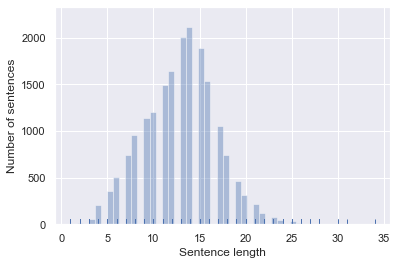

In [84]:
#Plot the sentence legth and its distribution
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(color_codes=True)
plt.xlabel('Sentence length')
plt.ylabel('Number of sentences')
sns.distplot(sentence_lengths, kde=False, rug=True)

In [ ]:
# Display and plot class label distribution and count
#count_table(data, 'label', 'barh')

In [87]:
#Remove very short text setnences
print(data['label'][data['text'].apply(lambda x: len(x.split(' ')) < 5)].value_counts())

not_related_or_irrelevant                            137
sympathy_and_emotional_support                        75
other_useful_information                              47
donation_needs_or_offers_or_volunteering_services     11
caution_and_advice                                     7
displaced_people_and_evacuations                       3
injured_or_dead_people                                 2
infrastructure_and_utilities_damage                    2
Name: label, dtype: int64


In [88]:
data = data[data['text'].apply(lambda x: len(x.split(' ')) > 5)]

,label,% of Count
other_useful_information,5127,27.970540
donation_needs_or_offers_or_volunteering_services,2978,16.246590
injured_or_dead_people,2727,14.877250
not_related_or_irrelevant,2147,11.713039
sympathy_and_emotional_support,1919,10.469176
infrastructure_and_utilities_damage,1416,7.725041
caution_and_advice,1038,5.662848
displaced_people_and_evacuations,568,3.098745
missing_trapped_or_found_people,410,2.236770


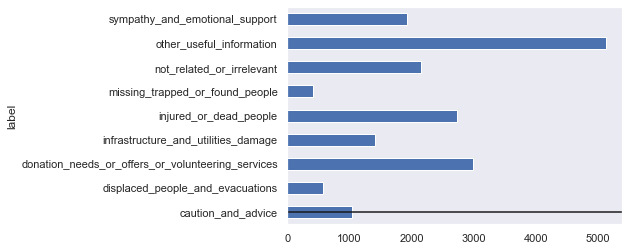

In [89]:
count_table(data, 'label','barh')

In [90]:
# look into the tokens again, as well as max sent length
all_words = [word for tokens in data["text"].str.split() for word in tokens]
vocab = sorted(list(set(all_words))) # get rid of duplicates words by set
sentence_lengths = [len(tokens) for tokens in data["text"].str.split()]

print("%s words total, with a vocabulary size of %s" % (len(all_words), len(vocab)))
print("Max sentence length is %s" % max(sentence_lengths))

240942 words total, with a vocabulary size of 22558
Max sentence length is 34


<AxesSubplot:xlabel='Sentence length', ylabel='Number of sentences'>

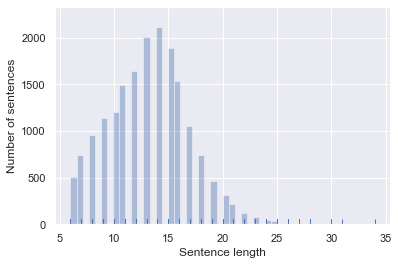

In [91]:
sns.set(color_codes=True)
plt.xlabel('Sentence length')
plt.ylabel('Number of sentences')
sns.distplot(sentence_lengths, kde=False, rug=True)

In [92]:
#Explore at word level and see the frequency distribution of words
from nltk.probability import FreqDist
fdist = FreqDist(all_words)
print(fdist)

<FreqDist with 22558 samples and 240942 outcomes>


In [93]:
#Most common words
fdist.most_common(50)

[('urls', 24803),
 ('usrId', 13155),
 ('rt', 8889),
 ('earthquake', 4194),
 ('DD', 2867),
 ('nepal', 2647),
 ('chile', 2125),
 (';', 1846),
 ('!', 1776),
 ('india', 1653),
 ('pakistan', 1402),
 ('floods', 1380),
 ('de', 1338),
 ('flood', 1323),
 ('D', 1295),
 ('amp', 1241),
 ('people', 1177),
 ('california', 1173),
 ('quake', 1111),
 ('vanuatu', 1069),
 ('rubyph', 1035),
 ('cyclone', 1032),
 ('help', 988),
 ('en', 975),
 ('odile', 926),
 ('news', 920),
 ('?', 901),
 ('kashmir', 852),
 ('hurricane', 832),
 ('napa', 801),
 ('via', 770),
 ('typhoon', 762),
 ('terremoto', 758),
 ('pam', 746),
 ('relief', 733),
 ('dead', 721),
 ('hagupit', 717),
 ('tsunami', 715),
 ('hit', 695),
 ('damage', 668),
 ('killed', 606),
 ('…', 596),
 ('el', 573),
 ('affected', 564),
 ('toll', 519),
 ('iquique', 513),
 ('ayuda', 497),
 ('northern', 494),
 ('philippines', 488),
 ('por', 482)]

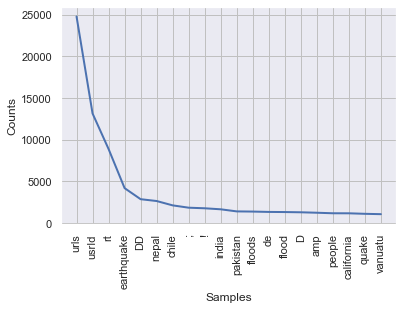

In [94]:
# Frequency Distribution Plot
#import matplotlib.pyplot as plt
fdist.plot(20,cumulative=False)
plt.show()

In [95]:
#Doing manual cleanup of some high frequency words and words without any relevance
REMWORDS = ['rt','DD','urls','usrId','nepal','china','india','pakistan','de','D','amp;','00','california','en','odile','kashmir'
           ';','chile',';','!','amp','rubyph','vanuatu','?', '…', 'ayuda','.','..','por','el','kashmir','’' ]
def clean_SW(text):
    text_tokens = word_tokenize(text)
    text = ' '.join(word for word in text_tokens if word not in REMWORDS) # remove stopwors from text
    return text

In [96]:
data['text'] = data['text'].apply(clean_SW)

In [97]:
all_words = [word for tokens in data["text"].str.split() for word in tokens]

In [98]:
fdist = FreqDist(all_words)
print(fdist)

<FreqDist with 22529 samples and 165198 outcomes>


In [99]:
fdist.most_common(50)

[('earthquake', 4194),
 ('floods', 1380),
 ('flood', 1323),
 ('people', 1177),
 ('quake', 1111),
 ('cyclone', 1032),
 ('help', 988),
 ('news', 920),
 ('hurricane', 832),
 ('napa', 801),
 ('via', 770),
 ('typhoon', 762),
 ('terremoto', 758),
 ('pam', 746),
 ('relief', 733),
 ('dead', 721),
 ('hagupit', 717),
 ('tsunami', 715),
 ('hit', 695),
 ('damage', 668),
 ('killed', 606),
 ('affected', 564),
 ('toll', 519),
 ('iquique', 513),
 ('northern', 494),
 ('philippines', 488),
 ('nepalearthquake', 479),
 ('los', 478),
 ('death', 455),
 ('victims', 440),
 ('please', 431),
 ('magnitude', 429),
 ('la', 424),
 ('aid', 408),
 ('balochistan', 401),
 ('new', 385),
 ('muertos', 378),
 ('prayforchile', 376),
 ('cabo', 372),
 ('que', 371),
 ('prayers', 368),
 ('hits', 365),
 ('rescue', 347),
 ('flooding', 344),
 ('us', 334),
 ('one', 333),
 ('many', 332),
 ('least', 332),
 ('monsoon', 320),
 ('still', 310)]

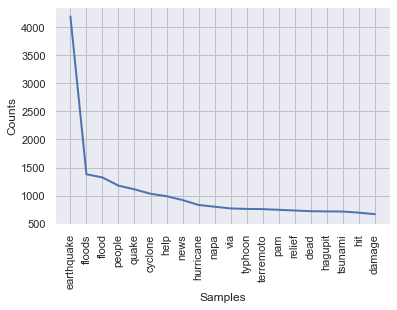

In [100]:
fdist.plot(20,cumulative=False)
plt.show()

In [101]:
#Write the combined and processed data into CSV
data.to_csv('CrisisNLP_CP.csv', index=False)
data.head()

,label,text
0,infrastructure_and_utilities_damage,solar lamps public light electric poles solar ...
1,other_useful_information,another earthquake registered magnitude
2,other_useful_information,big show running cause massive earthquake noth...
3,infrastructure_and_utilities_damage,alaska airlines halts flights la cabo san luca...
4,other_useful_information,news update northern experiences powerful eart...


In [102]:
#Handling classimbalance
#Oversampling and downsampling data
from sklearn.utils import resample

In [104]:
#Separate majority and minority classes
OU = data[data.label=='other_useful_information']
DN= data[data.label=='donation_needs_or_offers_or_volunteering_services']
ID = data[data.label=='injured_or_dead_people']
NR = data[data.label=='not_related_or_irrelevant']
SE = data[data.label=='sympathy_and_emotional_support']
IU = data[data.label=='infrastructure_and_utilities_damage']
CA = data[data.label=='caution_and_advice']
DP = data[data.label=='displaced_people_and_evacuations']
MT = data[data.label=='missing_trapped_or_found_people']

In [105]:
#as an assumption, for expermenting will use the median count value of 1919 as sample size
OUU = resample(OU,replace=False, n_samples=1919,random_state=123) 
DNU = resample(DN,replace=False, n_samples=1919,random_state=123)
IDU = resample(ID,replace=False, n_samples=1919,random_state=123)
NRU = resample(NR,replace=False, n_samples=1919,random_state=123)
SEU = resample(SE,replace=False, n_samples=1919,random_state=123)
IEU = resample(IU,replace=True, n_samples=1919,random_state=123)
CAU = resample(CA,replace=True, n_samples=1919,random_state=123)
DPU = resample(DP,replace=True, n_samples=1914,random_state=123)
MTU = resample(MT,replace=True, n_samples=1919,random_state=123)


In [106]:
datab = pd.concat([OUU,DNU,IDU,NRU,SEU,IEU,CAU,DPU,MTU])

,label,% of Count
caution_and_advice,1919,11.114329
infrastructure_and_utilities_damage,1919,11.114329
sympathy_and_emotional_support,1919,11.114329
other_useful_information,1919,11.114329
injured_or_dead_people,1919,11.114329
not_related_or_irrelevant,1919,11.114329
donation_needs_or_offers_or_volunteering_services,1919,11.114329
missing_trapped_or_found_people,1919,11.114329
displaced_people_and_evacuations,1914,11.085370


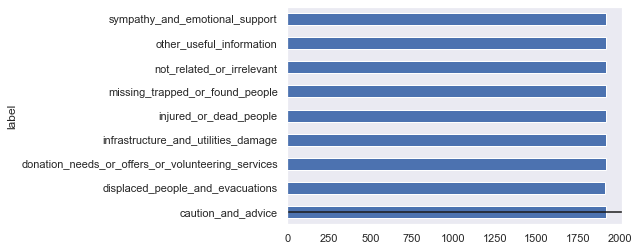

In [107]:
count_table(datab, 'label','barh')

In [111]:
#Randomize the data
np.random.seed(42)
datab = datab.sample(frac=1)
datab = datab.reset_index(drop=True)

In [112]:
#Write the combined, processed, and balanced data into a csv file
datab.to_csv('CrisisNLP_CPB.csv', index=False)
datab.head()

,label,text
0,sympathy_and_emotional_support,fuerzachile nuestro corazón oraciones con uste...
1,caution_and_advice,updated saturday downgraded super typhoon typhoon
2,injured_or_dead_people,impossible keep rising death toll links ongoin...
3,caution_and_advice,via pagasa states intensification typhoon stil...
4,other_useful_information,arutz7 watch cctv shows moment powerful earthq...


In [116]:
datab

,label,text
0,sympathy_and_emotional_support,fuerzachile nuestro corazón oraciones con uste...
1,caution_and_advice,updated saturday downgraded super typhoon typhoon
2,injured_or_dead_people,impossible keep rising death toll links ongoin...
3,caution_and_advice,via pagasa states intensification typhoon stil...
4,other_useful_information,arutz7 watch cctv shows moment powerful earthq...
...,...,...
17261,infrastructure_and_utilities_damage,news ： wine country quake losses seen billions...
17262,caution_and_advice,alert multan flood river peaks bbc news
17263,injured_or_dead_people,scores killed flooding bhadra sharma nida naja...
17264,other_useful_information,wish gay earthquake killed transgendered people
